<a href="https://colab.research.google.com/github/yonitsur/ML-workshop/blob/main/notebooks/Pretrained_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import cv2
import yaml
import sys
import os
from IPython import display
import time
from google.colab import drive
import torch
import torch.nn as nn
from PIL import Image


In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
from segment_anything.utils.amg import *
from pycocotools import mask as mask_utils

PyTorch version: 2.0.1+cu118
Torchvision version: 0.15.2+cu118
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-ym_52w8o
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-ym_52w8o
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36586 sha256=6b6553fe79db9799598aa9ab2a1126f3061f49d01675baf6247a2f4f99e67fea
  Stored in directory: /tmp/pip-ephem-wheel-cache-hrg1c6t2/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything


In [ ]:
folder_path = "/content/drive/MyDrive/Project/Project/data"
project_path = "/content/drive/MyDrive/Project/Project/"
# folder_path = "/content/drive/MyDrive/Project/data"
# project_path = "/content/drive/MyDrive/Project"

In [ ]:
# images = ['DJI_20230221091035_0034_V', 'DJI_20230221095213_0011_V', 'DJI_20230221100215_0124_V',
#           'DJI_20230221081744_0017_V']
# images_arik = ['DJI_20230221100215_0124_V', 'DJI_20230221095213_0011_V', 'DJI_20230221091850_0113_V', 'DJI_20230221081744_0017_V', 'DJI_20230221090557_0040_V', 'DJI_20230221091035_0034_V','DJI_20230221095459_0062_V']
# images_yoni = [
#           'DJI_20230221095523_0076_V', 'DJI_20230221091056_0043_V', 'DJI_20230221091125_0053_V', 'DJI_20230221091254_0083_V', 'DJI_20230221091256_0084_V', 'DJI_20230221091309_0089_V', 'DJI_20230221091316_0091_V',
#           'DJI_20230221095512_0069_V', 'DJI_20230221100140_0114_V', 'DJI_20230221095222_0016_V', 'DJI_20230221095228_0020_V', 'DJI_20230221091042_0037_V', 'DJI_20230221091322_0095_V', 'DJI_20230221093958_0112_V',
#           'DJI_20230221095049_0049_V', 'DJI_20230221095216_0013_V', 'DJI_20230221095235_0022_V']
# images_adi = [ 'DJI_20230221095630_0096_V',
#           'DJI_20230221095511_0068_V',
#           'DJI_20230221095408_0051_V', 'DJI_20230221095224_0017_V', 'DJI_20230221095221_0015_V', 'DJI_20230221095237_0023_V', 'DJI_20230221095259_0031_V', 'DJI_20230221095102_0059_V',
#           'DJI_20230221095159_0005_V',
#           'DJI_20230221095210_0009_V']

In [ ]:
labels_dict ={ 'Metal':0,
              'Metal (general)': 0,
              'Metal (iron bender)':0,
              'Metal (pipe)':0,
              'Wood (pallett)':1,
              'Wood (pallet)':1,
              'Wood (scraps/cuttings)':1,
              'Wood': 1,
              'Paper':2,
              'Carton':2,
              'Carton+Paper':2,
              'Nylon':3,
              'Plastic (big bag)':3,
              'Plastic (bucket)':3,
              'Plastic (general)':3,
              'Plastic (pipe)':3,
              'Plastic (sand bag)':3,
              'Plastic':3,
              'Polymers':3,
              'Flexible polymers':3,
              'Rigid polymers':3,
              'Gypsum':4,
              'Concrete':4,
              'Ceramics':4,
              'Construction':4,
              'Mineral':4,
              'Rubber':5,
              'Background':6,

              #others
              'Styrofoam':7,
              'Textil':7,
              'Textil/Fabric/Cloth':7,
              'Glass':7,
              'Other':7,
              'Other(Styrofoam, Textil, Glass)':7
              }

reverse_labels_dict = {0:'Metal',
                1:'Wood',
               2:'Carton+Paper',
               3:'Polymers',
               4:'Mineral',
                5:'Rubber',

               6:'Background',
              7:'Other'
                       }

# labels_dict = {'Metal (general)':0, 'Metal (iron bender)':0, 'Metal (pipe)':0,
#                'Wood (pallett)':1, 'Wood (scraps/cuttings)':1,
#                'Carton':2,
#                'Concrete':3,
#                'Plastic (big bag)':4, 'Plastic (bucket)':4, 'Plastic (general)':4,
#                'Plastic (pipe)':4, 'Plastic (sand bag)':4,
#                'Nylon':5,
#                'Rubber':6,
#                'Textil':7,
#                'Background':8}

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

In [ ]:
# img = cv2.imread(f'{folder_path}/Arik/{images_arik[0]}/split_7/mask_24.jpg')
# # print(f'{folder_path}/{images[0]}/{images[0]}.jpg')
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# im_pil = Image.fromarray(img)

In [ ]:
# old_size = im_pil.size
# desired_size=256
# ratio = float(desired_size)/max(old_size)
# new_size = tuple([int(x*ratio) for x in old_size])
# # use thumbnail() or resize() method to resize the input image

# # thumbnail is a in-place operation

# # im.thumbnail(new_size, Image.ANTIALIAS)

# # im_pil = im_pil.resize(new_size, Image.LANCZOS)
# # create a new image and paste the resized on it

# new_im = Image.new("RGB", (desired_size, desired_size))
# new_im.paste(im_pil, ((desired_size-old_size[0])//2,
#                     (desired_size-old_size[1])//2))

# plt.imshow(new_im)

In [ ]:
import skimage.feature as feature

def get_texture_features(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  graycom = feature.graycomatrix(gray, [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], levels=256)

  # Find the GLCM properties
  contrast = feature.graycoprops(graycom, 'contrast')
  dissimilarity = feature.graycoprops(graycom, 'dissimilarity')
  homogeneity = feature.graycoprops(graycom, 'homogeneity')
  energy = feature.graycoprops(graycom, 'energy')
  correlation = feature.graycoprops(graycom, 'correlation')
  ASM = feature.graycoprops(graycom, 'ASM')

  feat = np.concatenate([contrast, dissimilarity, homogeneity, energy, correlation, ASM])
  mean = feat.mean(axis=1).reshape(-1, 1)
  std = feat.std(axis=1).reshape(-1, 1)
  feat = (feat - mean)/std

  return feat.flatten().tolist()

In [ ]:
# print(get_texture_features(img))

In [ ]:
# img = cv2.imread(f'{folder_path}/Arik/{images_arik[0]}/split_7/mask_24.jpg')

# feat = get_texture_features(img)
# print(feat)
# mean = feat.mean(axis=1).reshape(-1, 1)
# std = feat.std(axis=1).reshape(-1, 1)
# feat = (feat - mean)/std
# print(feat)

In [ ]:
# images = os.listdir(f'{folder_path}/Adi')
# for img_name in images[-2:]:
# # img_name = 'DJI_20230221100215_0124_V'
#   print(img_name)
#   for sp in range(16):
#     with open(f'{folder_path}/Adi/{img_name}/split_{sp}/seg_{sp}.yaml') as f:
#       seg = yaml.safe_load(f)
#     for mask in seg[img_name][sp].keys():
#       mask_img = cv2.imread(f'{folder_path}/Adi/{img_name}/split_{sp}/{mask}.jpg')
#       seg[img_name][sp][mask]['textures'] = get_texture_features(mask_img)
#     with open(f'{folder_path}/Adi/{img_name}/split_{sp}/seg_{sp}.yaml', 'w') as f:
#       yaml.dump(seg,f)

In [ ]:
NORMALIZE = True

In [ ]:
import json

with open(f'{project_path}/jsons/annotations.json') as f:
  json_dict1 = json.load(f)
with open(f'{project_path}/jsons/segs.json') as f:
  seg = json.load(f)
# json_dict1.update(json_dict2)

In [ ]:
for im in json_dict1.keys():
  json_dict1[im] = {int(key.split("_")[-1]):val for key, val in json_dict1[im].items()}

In [ ]:
print(json_dict1)

{'20220705_115213': {0: {'mask_0': 'Other(Styrofoam, Textil, Glass)', 'mask_11': 'Unknown', 'mask_12': 'Unknown', 'mask_13': 'Other(Styrofoam, Textil, Glass)'}, 1: {}, 10: {}, 11: {}, 12: {}, 13: {}, 14: {}, 15: {}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}, 8: {}, 9: {}}, '20220711_082019': {0: {}, 1: {}, 10: {}, 11: {}, 12: {}, 13: {}, 14: {}, 15: {}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}, 8: {}, 9: {}}, '20221015_075959': {0: {}, 1: {}, 10: {}, 11: {}, 12: {}, 13: {}, 14: {}, 15: {}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}, 8: {}, 9: {}}, '20221130_134447': {0: {}, 1: {}, 10: {}, 11: {}, 12: {}, 13: {}, 14: {}, 15: {}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}, 8: {}, 9: {}}, '20221211_122752': {0: {}, 1: {}, 10: {}, 11: {}, 12: {}, 13: {}, 14: {}, 15: {}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}, 8: {}, 9: {}}, '20230204_102517': {0: {}, 1: {}, 10: {}, 11: {}, 12: {}, 13: {}, 14: {}, 15: {}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}, 8: {}, 9: {}}, '20230208_130836': {0: {}, 1: {}

In [ ]:
sizes = {}

In [ ]:
def imshow(inp, t=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    if NORMALIZE:
      mean = np.array([0.485, 0.456, 0.406])
      std = np.array([0.229, 0.224, 0.225])
      inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    # ax.figure(figsize=(5,5))
    plt.imshow(inp)
    if t is not None:
        plt.title(t)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
from PIL import ImageOps

In [ ]:
# owner, image_name, sp, m = "Yoni", "DJI_20230221095216_0013_V",5,"mask_6"
# fp = folder_path
# img = cv2.imread("/content/drive/MyDrive/Project/Project/data/Yoni/DJI_20230221095216_0013_V/split_5/mask_6.jpg")
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# im_pil = Image.fromarray(img)

# for _ in [0,15,30,45,60,75]:
#   im_pil = im_pil.rotate(_, Image.NEAREST, expand=1)
#   image = im_pil
#   image_array = np.array(image)
#   lower_threshold = np.array([20, 20, 20])  # Minimum color values
#   upper_threshold = np.array([255, 255, 255])  # Maximum color values
#   binary_mask = np.all((image_array >= lower_threshold) & (image_array <= upper_threshold), axis=-1)
#   object_pixels = np.where(binary_mask)

#   min_y, min_x = np.min(object_pixels, axis=1)
#   max_y, max_x = np.max(object_pixels, axis=1)
#   coverage = np.sum(binary_mask)/((max_x-min_x)*(max_y-min_y))
#   print(_, coverage)
#   bbox_image = Image.fromarray(image_array[min_y:max_y+1, min_x:max_x+1])
#   bbox_image.save("bounding_box.png")
#   bbox_image.show()

#   # Bounding box coordinates
#   im_pil=im_pil.crop((min_x,min_y,max_x,max_y))
#   plt.imshow(im_pil)
#   plt.show()
#   im_pil = im_pil.rotate(-_, Image.NEAREST, expand=1)

In [ ]:
def get_vector(image, mask=None, bins=256):
    red = cv2.calcHist(
        [image], [2], mask, [bins], [0, 256]
    )
    green = cv2.calcHist(
        [image], [1], mask, [bins], [0, 256]
    )
    blue = cv2.calcHist(
        [image], [0], mask, [bins], [0, 256]
    )
    vector = np.concatenate([red, green, blue], axis=0)
    vector = vector.reshape(-1)
    return vector

def is_grey(vec):
    four_bin = [vec[2*i]+vec[2*i+1] for i in range(12)]
    return 1 if max(abs(four_bin[0] - four_bin[4]), abs(four_bin[0] - four_bin[8]),
             abs(four_bin[4] - four_bin[8])
             , abs(four_bin[1] - four_bin[5]), abs(four_bin[1] - four_bin[9]),
             abs(four_bin[5] - four_bin[9])) < 0.05 else 0


def generate_ellipse_pixels(ellipse):
    center, axes, rotation_angle = ellipse
    center_x, center_y = center
    major_axis, minor_axis = axes
    angle_rad = math.radians(rotation_angle)

    # Generate points along the ellipse perimeter
    points = []
    for angle_step in np.arange(0, 360, 0.2):  # Adjust the step size for denser or sparser points
        angle_rad_step = math.radians(angle_step)
        x = int(center_x + (major_axis/2) * math.cos(angle_rad_step) * math.cos(angle_rad) - (minor_axis/2) * math.sin(angle_rad_step) * math.sin(angle_rad))
        y = int(center_y + (major_axis/2) * math.cos(angle_rad_step) * math.sin(angle_rad) + (minor_axis/2) * math.sin(angle_rad_step) * math.cos(angle_rad))
        points.append((x, y))

    return points

from scipy.spatial.distance import cdist

def calc_circularity(mask):
    binary_mask = np.uint8(mask) * 255
    contour, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    area = cv2.contourArea(contour[0])
    perimeter = cv2.arcLength(contour[0], True)  # True for a closed contour

    # Calculate circularity
    circularity = (4 * np.pi * area) / (perimeter ** 2)
    return circularity

def measure_fitness(contour_points, ellipse_points):
    total_dist = 0
    # for contour_point in contour_points:
    #     min_dist = float('inf')
    #     for ellipse_point in ellipse_points:
    #         dist = np.linalg.norm(np.array(ellipse_point) - np.array(contour_point[0]))
    #         if dist < min_dist:
    #             min_dist = dist
    #     total_dist += min_dist**2  # Accumulate distances
    contour_arr = np.array([point[0] for point in contour_points])
    ellipse_arr = np.array(ellipse_points)

    distances = cdist(contour_arr, ellipse_arr, 'euclidean')
    min_distances = np.min(distances, axis=1)
    total_dist = np.sum(min_distances ** 2)

    # Normalize by the number of contour points
    fitness = total_dist / len(contour_points)
    return fitness

def is_curvy(mask):
    ellipse_like_thresh = 2.0
    aspect_ratio_thresh = 0.3
    intersection_ratio_thresh = 0.3
    segment_length = 50
    binary_mask = np.uint8(mask) * 255
    contours, hierarchy = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # drawing = np.zeros((binary_mask.shape[0], binary_mask.shape[1], 3), dtype=np.uint8)
    # drawing = cv2.drawContours(drawing, contours, 0, (0,0,255), 2, cv2.LINE_8, hierarchy, 0)

    segments = [contours[0][i:i + segment_length] for i in range(0, len(contours[0]), segment_length // 2)]
    min_fit = float('inf')
    second_min_fit = min_fit + 1
    for segment in segments:
        if len(segment) < segment_length//2:
            continue
        ellipse = cv2.fitEllipse(segment)
        (x, y), (minAxis, maxAxis), angle = ellipse
        canvas = np.zeros((binary_mask.shape[0], binary_mask.shape[1]), dtype=np.uint8)
        cv2.ellipse(canvas, (int(x), int(y)), (int(minAxis//2), int(maxAxis//2)), int(angle), 0, 360, 255, -1)
        intersection = cv2.bitwise_and(canvas, binary_mask)
        intersection_area = np.sum(intersection == 255)
        ellipse_area = np.sum(canvas == 255)
        # Calculate the portion of the ellipse area inside the contour
        portion_inside_contour = 0.0 if ellipse_area == 0 else intersection_area / ellipse_area
        if maxAxis * minAxis < 100 or minAxis / maxAxis < aspect_ratio_thresh:
            continue
        elif portion_inside_contour < intersection_ratio_thresh:
            continue
        # plt.imshow(cv2.ellipse(drawing,ellipse,(0,255,0),2))
        # plt.show()
        points = generate_ellipse_pixels(ellipse)
        relative_fitness = measure_fitness(segment, points)
        if relative_fitness < min_fit:
            second_min_fit = min_fit
            min_fit = relative_fitness
        elif relative_fitness < second_min_fit:
            second_min_fit = relative_fitness
    return 1 if min_fit < ellipse_like_thresh and second_min_fit < ellipse_like_thresh else 0

In [ ]:
class SplitDatasetMaskedResized(Dataset):
  def __init__(self, path, owner, image_name, sp, rotation=0, flip=None, color_aug=False, crops=False, local=False):
    self.image_name = image_name
    self.sp = sp
    self.local = local
    self.folder_path = path
    self.owner = owner
    self.seg=seg
    self.rotation=rotation
    self.crop = crops
    self.flip = flip
    self.color_aug = color_aug
    self.im_path = f'{self.folder_path}/{owner}/{image_name}'
    self.split_path = f'{self.im_path}/split_{sp}'
    # with open(f'{self.split_path}/seg_{sp}.yaml') as f:
    #   self.seg = yaml.safe_load(f)
    files_in_folder = os.listdir(self.split_path)
    self.ann_dict={image_name:{sp:{}}}
    if f'anns_{sp}.yaml' in files_in_folder:
      with open(f'{self.split_path}/anns_{sp}.yaml', 'r') as f:
        self.ann_dict = yaml.safe_load(f)
        # print(self.ann_dict)
        # if len(self.ann_dict[self.image_name][self.sp]) == 0:
        #   self.ann_dict.update(json_dict1)
        # elif self.image_name in json_dict1:
        #   for mask in json_dict1[self.image_name][self.sp]:
        #     if mask in self.ann_dict[self.image_name][self.sp]:
        #       if self.ann_dict[self.image_name][self.sp][mask]!=json_dict1[self.image_name][self.sp][mask]:
        #         print(self.image_name, self.sp, mask)
        #     else:
        #       self.ann_dict[self.image_name][self.sp][mask] = json_dict1[self.image_name][self.sp][mask]
        #print(self.image_name, self.sp)
        # Remove all unknowns
    if self.image_name in json_dict1 and self.sp in json_dict1[self.image_name]:
      self.ann_dict[self.image_name][self.sp].update(json_dict1[self.image_name][self.sp])

    # discarded = len([a for a in self.ann_dict[self.image_name][self.sp].values() if a in ['Paper', 'Rubber', 'Glass']])
    # self.others = discarded

    self.ann_dict[self.image_name][self.sp] = {key:val for key, val in self.ann_dict[self.image_name][self.sp].items()
      if val in labels_dict.keys() and key in self.seg[image_name][f'split_{sp}'] and self.seg[image_name][f'split_{sp}'][key]['area'] > 2000}
        # TODO: eliminate masks that are too small


  def __len__(self):
    return len(self.ann_dict[self.image_name][self.sp])

  def __getitem__(self, idx):
    annotated_masks = list(self.ann_dict[self.image_name][self.sp].keys())
    # self.sizes = np.zeros((len(annotated_masks),2))
    m = annotated_masks[idx]
    if not self.local:
      fp = folder_path # Take care of differences when working on colab vs locally
    else:
      fp = folder_path
    img = cv2.imread(f'{fp}/{self.owner}/{self.image_name}/split_{self.sp}/{m}.jpg')
    texture = torch.Tensor(self.seg[self.image_name][f'split_{self.sp}'][m]['textures'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    im_pil = Image.fromarray(img)

    mask = rle_to_mask(self.seg[self.image_name][f'split_{self.sp}'][m]['segmentation']).astype("uint8")
    color_hist = get_vector(sp_img, mask, num_bins_global)


    circular = 1 if calc_circularity(mask) > 0.6 else 0
    curve = is_curvy(mask)
    # ellipse_fit = 0
    color_hist_ = color_hist / np.sum(color_hist)
    val = 1 if color_hist_[0] + color_hist_[1] + color_hist_[2] + color_hist_[3] + color_hist_[8] + color_hist_[9] + \
               color_hist_[10] \
               + color_hist_[11] + color_hist_[16] + color_hist_[17] + color_hist_[18] + color_hist_[19] >= 0.85 else 0
    gray = is_grey(color_hist_)
    low_ASM = 1 if (texture[-4] < 0.2 and texture[-3] < 0.2 and texture[-2] < 0.2 and texture[-1] < 0.2) else 0

    feat = torch.from_numpy(np.concatenate([texture, color_hist, [circular], [curve], [val], [gray], [low_ASM]]))


    if self.rotation != 0:
      im_pil = im_pil.rotate(self.rotation, Image.NEAREST, expand=1)
    if self.flip != None:
      if self.flip == "h":
        im_pil = im_pil.transpose(Image.FLIP_LEFT_RIGHT)
      elif self.flip == "v":
        im_pil = im_pil.transpose(Image.FLIP_TOP_BOTTOM)

    if (self.seg[self.image_name][f'split_{self.sp}'][m]['area']/(im_pil.size[0]*im_pil.size[1]))<0.4:
      best_coverage = 0
      best_img = im_pil
      for _ in [15,30,45,60,75,90]:
        im_pil = im_pil.rotate(_, Image.NEAREST, expand=1)
        image = im_pil
        image_array = np.array(image)
        lower_threshold = np.array([20, 20, 20])  # Minimum color values
        upper_threshold = np.array([255, 255, 255])  # Maximum color values
        binary_mask = np.all((image_array >= lower_threshold) & (image_array <= upper_threshold), axis=-1)
        object_pixels = np.where(binary_mask)

        min_y, min_x = np.min(object_pixels, axis=1)
        max_y, max_x = np.max(object_pixels, axis=1)
        coverage = np.sum(binary_mask)/((max_x-min_x)*(max_y-min_y))

        # print(_, coverage)
        # bbox_image = Image.fromarray(image_array[min_y:max_y+1, min_x:max_x+1])
        # bbox_image.save("bounding_box.png")
        # bbox_image.show()

        # Bounding box coordinates
        im_pil=im_pil.crop((min_x,min_y,max_x,max_y))
        if(coverage>best_coverage):
          best_coverage = coverage
          best_img = im_pil
        im_pil = im_pil.rotate(-_, Image.NEAREST, expand=1)

      im_pil = best_img

    sizes[str(feat.detach())] = self.owner, self.image_name, self.sp, m, im_pil.size, area

    preprocess0 = transforms.Compose([
    transforms.Resize((224,224)),
    # transforms.CenterCrop(224),
    transforms.ToTensor()
    ])
    preprocess1 = transforms.Compose([
    transforms.Resize((224,224)),
    # transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    preprocess2 = transforms.Compose([
    transforms.Resize((224,224)),
    # transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.ColorJitter(brightness=0.02, contrast=0.02, saturation=0.02, hue=0.02),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    preprocess3 = transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.ToTensor(),
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    # input_tensor = preprocess(im_pil)
    if NORMALIZE:
        if self.crop:
          input_tensor = preprocess3(im_pil)
        elif self.color_aug:
          input_tensor = preprocess2(im_pil)
        else:
          input_tensor = preprocess1(im_pil)
    else:
        input_tensor = preprocess0(im_pil)

    # mask = rle_to_mask(self.seg[self.image_name][self.sp][m]['segmentation'])
    label = self.ann_dict[self.image_name][self.sp][m]
    y = labels_dict[label]
    return input_tensor, feat, y



In [ ]:
# ds = SplitDatasetMaskedResized(folder_path, 'Yoni', images_yoni[-1], 0)
# print(len(ds))

In [ ]:
# print(ds[0])

In [ ]:
# train_arr = []
# val_arr = []
# test_arr = []
arr = []
from tqdm import tqdm
for image in tqdm(os.listdir(f'{folder_path}/Arik')):
  for split in range(16):
      ds = SplitDatasetMaskedResized(folder_path, 'Arik', image, split)
      arr.append(ds)
for image in tqdm(os.listdir(f'{folder_path}/Yoni')):
  for split in range(16):
      ds = SplitDatasetMaskedResized(folder_path, 'Yoni', image, split)
      arr.append(ds)
for image in tqdm(os.listdir(f'{folder_path}/Adi')):
  for split in range(16):
      ds = SplitDatasetMaskedResized(folder_path, 'Adi', image, split)
      arr.append(ds)
# train_ds = torch.utils.data.ConcatDataset(train_arr)
# val_ds = torch.utils.data.ConcatDataset(val_arr)
# test_ds = torch.utils.data.ConcatDataset(test_arr)
curr_ds = torch.utils.data.ConcatDataset(arr)

100%|██████████| 31/31 [06:36<00:00, 12.80s/it]


In [ ]:
train_dataloader = DataLoader(train_ds, batch_size=64, shuffle=True)

In [ ]:
print(len(curr_ds))

18804


In [ ]:
torch.save(curr_ds, f'{project_path}/datasets/all_set_ready.pt')

In [ ]:
from joblib import dump, load

In [ ]:
clf = load(f'{project_path}/datasets/svm200_model.joblib')

In [ ]:
least_rubber = []
most_rubber = []

In [ ]:
ds_size = len(df['test'])
  for im, feat, y in tqdm(test_loader):
      original_feat = feat
      feat = feat.numpy()

      circular_matches = np.array([f[-5] for f in feat])
      curve_matches = np.array([f[-4] for f in feat])
      color_matches = np.array([f[-3] for f in feat])
      gray_matches = np.array([f[-2] for f in feat])
      low_asm_matches = np.array([f[-1] for f in feat])
      feat = np.array([f[:-5] for f in feat])

      preds = clf.predict(feat)
      not_candid_idx = np.where(circular_matches == 0.0)
      preds[not_candid_idx] = False
      not_candid_idx = np.where(curve_matches == 0.0)
      preds[not_candid_idx] = False
      not_candid_idx = np.where(color_matches == 0.0)
      preds[not_candid_idx] = False
      not_candid_idx = np.where(gray_matches == 0.0)
      preds[not_candid_idx] = False
      not_candid_idx = np.where(low_asm_matches == 0.0)
      preds[not_candid_idx] = False

      y = (y == 6)
      # wrong_idx = np.where(y==False)
      # wrong_imgs = im[wrong_idx]
      # for image in wrong_imgs:
      #     imshow(image)
      running_corrects += np.sum(preds == y.numpy())
      for l, p, image, f in zip(y, preds, im, original_feat):
          l = 1 if l else 0
          p = 1 if p else 0
          confusion_matrix[l, p] += 1

          if l != p:
              imshow(image, f"actual {l}, predicted {p}\n{sizes[str(f.detach())]}")

  acc = running_corrects / ds_size

In [ ]:
# 0:'Metal',
#                 1:'Wood',
#                2:'Carton+Paper',
#                3:'Polymers',
#                4:'Mineral',
#                 5:'Rubber',

#                6:'Background',
# #               7:'Other'
# metal_indices = [id for id, v in enumerate(curr_ds) if v[2]==0]
# metal_set = torch.utils.data.Subset(curr_ds, metal_indices)

In [ ]:
sets = {"all":{}, "train":{}, "val":{}, "test":{}}
lab = torch.zeros(len(reverse_labels_dict)).cuda()
for i, c in reverse_labels_dict.items():
    print(c)
    indices = [idx for idx, v in enumerate(dataset) if v[2]==i]
    lab[i] = len(indices)
    sets["all"][c] = torch.utils.data.Subset(dataset, indices)
    sets["train"][c], sets["val"][c], sets["test"][c] = torch.utils.data.random_split(sets["all"][c], [0.8, 0.1, 0.1])

train_ds = torch.utils.data.ConcatDataset(sets["train"].values())
val_ds = torch.utils.data.ConcatDataset(sets["val"].values())
test_ds = torch.utils.data.ConcatDataset(sets["test"].values())


In [ ]:
# l = len(curr_ds)
# generator1 = torch.Generator().manual_seed(42)
# train_ds, val_ds, test_ds = torch.utils.data.random_split(curr_ds, [0.6, 0.2, 0.2], generator=generator1)



In [ ]:
# torch.save(train_ds, f'{project_path}/datasets/train_ds_version212.pt')
# torch.save(val_ds, f'{project_path}/datasets/val_ds_version212.pt')
# torch.save(test_ds, f'{project_path}/datasets/test_ds_version212.pt')

In [ ]:
# train_ds = torch.load(f'{project_path}/datasets/train_ds_version202.pt')
# val_ds = torch.load(f'{project_path}/datasets/val_ds_version202.pt')
# test_ds = torch.load(f'{project_path}/datasets/test_ds_version202.pt')

In [ ]:
# from tqdm import tqdm

# very_small_ds = []
# small_ds = []
# medium_ds = []
# large_ds = []
# very_large_ds = []

# regular_ratio_ds = []
# big_ratio_ds = []
# very_big_ratio_ds = []

# good_coverage_ds = []
# medium_coverage_ds = []
# poor_coverage_ds = []

# for _, feat, _ in tqdm(test_ds):
#     owner, image, sp, m, size  = sizes[str(feat)]
#     with open(f'{folder_path}/{owner}/{image}/split_{sp}/seg_{sp}.yaml') as f:
#       seg = yaml.safe_load(f)
#     area = seg[image][sp][m]['area']
#     coverage = area/(size[0]*size[1])
#     # print(coverage)
#     #coverage checks
#     if coverage > 0.7:
#       good_coverage_ds.append((owner, image, sp, m))
#     elif coverage > 0.4:
#       medium_coverage_ds.append((owner, image, sp, m))
#     else:
#       poor_coverage_ds.append((owner, image, sp, m))

#     #Size checks
#     if size[0]*size[1] <= 5000:
#       very_small_ds.append((owner, image, sp, m))
#     if size[0]*size[1] <= 10000:
#       small_ds.append((owner, image, sp, m))
#     elif size[0]*size[1] <= 40000:
#       medium_ds.append((owner, image, sp, m))
#     elif size[0]*size[1] <= 100000:
#       large_ds.append((owner, image, sp, m))
#     else:
#       very_large_ds.append((owner, image, sp, m))

#     #Ratio checks
#     ratio = max(size[0]/size[1], size[1]/size[0])
#     if ratio < 1.5:
#       regular_ratio_ds.append((owner, image, sp, m))
#     elif ratio < 2.5:
#       big_ratio_ds.append((owner, image, sp, m))
#     else:
#       very_big_ratio_ds.append((owner, image, sp, m))



In [ ]:
# print(f'Very small: {len(very_small_ds)}, small: {len(small_ds)}, medium: {len(medium_ds)}, large: {len(large_ds)}, very_large: {len(very_large_ds)}')
# print(f'regular ratio: {len(regular_ratio_ds)}, big ratio: {len(big_ratio_ds)}, very big ratio: {len(very_big_ratio_ds)}')
# print(f'good coverage: {len(good_coverage_ds)}, medium coverage: {len(medium_coverage_ds)}, poor coverage: {len(poor_coverage_ds)}')

In [ ]:
# size_ds = {}
# size_ds['very_small'] = very_small_ds
# size_ds['small'] = small_ds
# size_ds['medium'] = medium_ds
# size_ds['large'] = large_ds
# size_ds['very_large'] = very_large_ds

# torch.save(size_ds, f'{project_path}/datasets/sizes_ds')

In [ ]:
# ratio_ds = {}
# ratio_ds['regular'] = very_small_ds
# ratio_ds['big'] = small_ds
# ratio_ds['very_big'] = medium_ds

# torch.save(ratio_ds, f'{project_path}/datasets/ratio_ds')

In [ ]:
# coverage_ds = {}
# coverage_ds['good'] = very_small_ds
# coverage_ds['medium'] = small_ds
# coverage_ds['poor'] = medium_ds

# torch.save(coverage_ds, f'{project_path}/datasets/coverage_ds')

In [ ]:
# size_ds = torch.load( f'{project_path}/datasets/sizes_ds')
# ratio_ds = torch.load(f'{project_path}/datasets/ratio_ds')
# coverage_ds = torch.load( f'{project_path}/datasets/coverage_ds')

In [ ]:
# print(num_adi, num_yoni, num_arik)

In [ ]:
# total = 0
# for ds in train_ds.dataset.datasets:
#     total += ds.others
# # print(train_ds[0])
# # val_ds = torch.load("./datasets/val_ds_version100.pt")
# for ds in val_ds.dataset.datasets:
#     total += ds.others
# # test_ds = torch.load("./datasets/test_ds_version100.pt")
# for ds in test_ds.dataset.datasets:
#     total += ds.others

In [ ]:
# print(total)

In [ ]:
# import copy
# t1 = copy.deepcopy(train_ds)
# for ds in t1.dataset.datasets:
#   # print(type)
#   ds.flip='h'
#   ds.rotation=0
#   ds.color_aug=False
# t2 = copy.deepcopy(train_ds)
# for ds in t2.dataset.datasets:
#   ds.rotation=0
#   ds.color_aug=False
# t = torch.utils.data.ConcatDataset([t1, t2])

In [ ]:
# print(t[6672], t[-1])
# trans = torchvision.transforms.ToPILImage()
# plt.imshow(trans(t[6672][0]))
# plt.show()
# plt.imshow(trans((t[-1][0])))
# plt.show()

In [ ]:
#save file of test
train_dataloader = DataLoader(train_ds, batch_size=64, shuffle=True)
valid_dataloader = DataLoader(val_ds, batch_size=64, shuffle=True)
test_dataloader = DataLoader(test_ds, batch_size=64, shuffle=True)

In [ ]:
def imshow(inp, t=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    if NORMALIZE:
      mean = np.array([0.485, 0.456, 0.406])
      std = np.array([0.229, 0.224, 0.225])
      inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    # ax.figure(figsize=(5,5))
    plt.imshow(inp)
    if t is not None:
        plt.title(t)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
# inputs, features, classes = next(iter(train_dataloader))
# # print(sizes)
# s = sizes[str(features[1])]
# print(s)
# imshow(inputs[1])
# im = inputs[1]
# t = transforms.Resize(s)
# im = t(im)
# imshow(im)

In [ ]:
# print(train_ds, train_dataset)
# print(len(train_ds), len(train_dataset))
# # print(train_ds[0] == train_dataset[0])

In [ ]:
# print(train_ds[0][2])

In [ ]:
# lab = torch.zeros(7).cuda()
# for a, b, y in train_ds:
#     lab[y] += 1

# lab = lab/lab.norm()
# lab = 1/lab
# # lab[13] = 0
# print(lab)

In [ ]:
dataset_sizes = {}
dataset_sizes['train'] = len(train_ds)
dataset_sizes['val'] = len(val_ds)
dataset_sizes['test'] = len(test_ds)

dataloaders = {}
dataloaders['train'] = train_dataloader
dataloaders['val'] = valid_dataloader
dataloaders['test'] = test_dataloader


In [ ]:
dataset_sizes

{'train': 6673, 'val': 2224, 'test': 2224}

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

# Best available weights (currently alias for IMAGENET1K_V2)
# Note that these weights may change across versions
original_model = resnet50(weights=ResNet50_Weights.DEFAULT)

In [ ]:
# weights = ResNet50_Weights.DEFAULT
# category_name = weights.meta['categories'][label]

In [ ]:
# from transformers import AutoFeatureExtractor, AutoModelForImageClassification

# extractor = AutoFeatureExtractor.from_pretrained("yangy50/garbage-classification")

# model = AutoModelForImageClassification.from_pretrained("yangy50/garbage-classification")

In [ ]:


# reverse_labels_dict = { 'Metal',
#               'Metal (iron bender)':0,
#               'Metal (pipe)':0,
#               'Wood (pallett)':1,
#               'Wood (scraps/cuttings)':1,
#               'Carton':2,
#               'Nylon':3,
#               'Plastic (big bag)':4,
#               'Plastic (bucket)':4,
#               'Plastic (general)':4,
#               'Plastic (pipe)':4,
#               'Plastic (sand bag)':4,
#               'Styrofoam':5,
#               'Paper':6,
#               'Textil':7,
#               'Gypsum':8,
#               'Concrete':9,
#               'Ceramics':10,
#               'Rubber':11,
#               'Background':12,
#               'Glass':13}


In [ ]:
# running_vloss = 0.0
# running_vaccuracy = 0.0
# original_model.eval()
# # confusion_matrix = torch.zeros(9, 9)
# # Disable gradient computation and reduce memory consumption.
# with torch.no_grad():
#     for i, vdata in enumerate(test_dataloader):
#         vinputs, vlabels = vdata
#         vlabels = vlabels.cuda()
#         # vinputs = vinputs.permute(0, 3, 1, 2)
#         # print(vinputs.shape)
#         voutputs = original_model(vinputs).cuda()
#         # voutputs = model(vinputs)
#         # vloss = loss_fn(voutputs, vlabels)
#         pred = voutputs.argmax(dim=1)
#         for i in range(pred.shape[0]):
#           category_name = weights.meta['categories'][pred[i]]
#           real = reverse_labels_dict[vlabels[i].item()]
#           print(category_name + " vs " + real)
#         # running_vaccuracy += (vlabels == pred).float().mean()
#         # for t, p in zip(vlabels.view(-1), pred.view(-1)):
#         #     confusion_matrix[t.long(), p.long()] += 1
#         # per_class_running_accuracy += (vlabels == pred).float()
#         # running_vloss += vloss

# # avg_vloss = running_vloss / (i + 1)
# avg_vaccuracy = running_vaccuracy / (i + 1)

# # print('LOSS valid {}'.format(avg_vloss))
# print('ACCURACY train valid {}'.format(avg_vaccuracy))
# # print('Per class accuracy:',confusion_matrix.diag()/confusion_matrix.sum(1))

In [ ]:
import copy
import seaborn as sns

def train_model(model, criterion, optimizer, scheduler, num_epochs=25, test=False):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 9999
    train_acc = []
    test_acc = []
    train_loss = []
    test_loss = []

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        confusion_matrix = torch.zeros(len(reverse_labels_dict), len(reverse_labels_dict))
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train' and test:
                continue
            if phase == 'train' and not test:
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            if phase == 'val' and test:
                phase = 'test'
            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for imgs, features, labels in dataloaders[phase]:
                # print(inputs, labels)
                imgs = imgs.cuda()
                features = features.cuda()
                labels = labels.cuda()

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model((imgs, features))
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * imgs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                if phase == 'val' or phase == 'test':
                    for t, p in zip(labels.view(-1), preds.view(-1)):
                        confusion_matrix[t.long(), p.long()] += 1

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            if phase == 'train':
                train_acc.append(epoch_acc.item())
                # print(epoch_acc)
                train_loss.append(epoch_loss)
            else:
                test_acc.append(epoch_acc.item())
                test_loss.append(epoch_loss)


            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
                group_counts = ["{0: 0.0f}".format(value) for value in confusion_matrix.flatten()]
                labels = [f"{v1}" for v1 in group_counts]
                labels = np.asarray(labels).reshape(len(reverse_labels_dict), len(reverse_labels_dict))
                sns.heatmap(confusion_matrix, annot=labels, fmt='', cmap='Blues',
                            xticklabels=reverse_labels_dict.values(), yticklabels=reverse_labels_dict.values())
                plt.show()

            if test and phase == 'test':
                group_counts = ["{0: 0.0f}".format(value) for value in confusion_matrix.flatten()]
                labels = [f"{v1}" for v1 in group_counts]
                labels = np.asarray(labels).reshape(len(reverse_labels_dict), len(reverse_labels_dict))
                sns.heatmap(confusion_matrix, annot=labels, fmt='', cmap='Blues',
                            xticklabels=reverse_labels_dict.values(), yticklabels=reverse_labels_dict.values())
                plt.show()

                per_class_amount = list(confusion_matrix.sum(1).numpy())
                per_class_recall = list((confusion_matrix.diag()/confusion_matrix.sum(1)).numpy())
                per_class_precision = list((confusion_matrix.diag()/confusion_matrix.sum(0)).numpy())
                per_class_f1 = list([(2*per_class_precision[i]*per_class_recall[i]/(per_class_precision[i]+per_class_recall[i])).item()
                                for i in range(len(per_class_recall))])
                return per_class_amount, per_class_precision, per_class_recall, per_class_f1
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Loss: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, (train_acc, train_loss, test_acc, test_loss)

In [ ]:
def imshow(inp, t=None, inp2=None, t2=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    if NORMALIZE:
      mean = np.array([0.485, 0.456, 0.406])
      std = np.array([0.229, 0.224, 0.225])
      inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    # ax.figure(figsize=(5,5))
    if inp2 is not None:
      inp2 = inp2.numpy().transpose((1, 2, 0))
      if NORMALIZE:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        inp2 = std * inp2 + mean
      inp2 = np.clip(inp, 0, 1)
      f, axarr = plt.subplots(1,2)
      # plt.subplot(121)
      # plt.plot(i[0], label='train_acc')
      # plt.plot(i[2], label='val_acc')
      axarr[0].imshow(inp)
      axarr[0].set_title(t)
      axarr[1].imshow(inp2)
      axarr[1].set_title(t2)
      #
    else:
      plt.imshow(inp)
    if t is not None:
        plt.title(t)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, features, classes = next(iter(dataloaders['train']))

# print(classes)
# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
# print(out)
imshow(out, t=[reverse_labels_dict[x.item()] for x in classes])

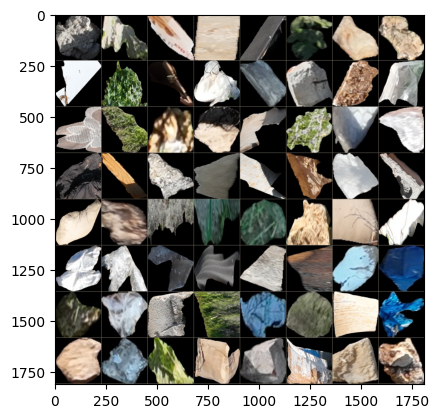

In [ ]:
# title=[reverse_labels_dict[x.item()] for x in classes]
# imshow(out)

In [ ]:
# title

In [ ]:
# print(original_model)

Transfer Learning: Freezing all layers except final fc

In [ ]:
class Altered(nn.Module):
    def __init__(self):
        super(Altered, self).__init__()
        for param in original_model.parameters():
            param.requires_grad = False
        num_ftrs = original_model.fc.in_features
        original_model.fc = nn.Linear(num_ftrs, 256)
        self.resnet = original_model.cuda()
        self.relu = nn.ReLU(inplace=True)
        self.fc_1 = nn.Linear(256, len(reverse_labels_dict)).cuda()
        # self.fc_2 = nn.Linear(24, len(reverse_labels_dict)).cuda()
        # self.seq = nn.Sequential(self.fc1, nn.ReLU(), self.fc2, nn.ReLU(), self.fc3)

    def forward(self, x):
        im, feat = x
        # feat = feat.cuda()
        out = self.resnet(im)
        out = self.relu(out)
        out1 = self.fc_1(out)

        # feat = feat.float()
        # feat = feat.reshape(-1, 24)
        # out2 = self.fc_2(feat)

        out = out1 #+ out2
        return out

In [ ]:
model = Altered()

In [ ]:
# print(model)

In [ ]:
import torch.optim as optim
from torch.optim import lr_scheduler
# model_conv = torchvision.models.resnet18(weights='DEFAULT')
# for param in original_model.parameters():
#     param.requires_grad = False

# # Parameters of newly constructed modules have requires_grad=True by default
# num_ftrs = original_model.fc.in_features
# net = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(256, 14))
# original_model.fc = nn.Linear(num_ftrs, 256)
# model = nn.Sequential(original_model, net)

# model = original_model
# print(model[0].fc, model[1][1])
criterion = nn.CrossEntropyLoss() #reweight the loss such that each class has equal contribution to the loss

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD([{'params': model.resnet.fc.parameters()},
                {'params': model.fc_1.parameters()}], lr=0.002, momentum=0.9)

# Decay LR by a factor of 0.1 every 15 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=10, gamma=0.5)

In [ ]:
# model_transfered, i = train_model(model, criterion, optimizer_conv,
#                          exp_lr_scheduler, num_epochs=40)
# # print(i)
# plt.figure(1)
# plt.subplot(211)
# plt.plot(i[0], label='train_acc')
# plt.plot(i[2], label='val_acc')
# plt.legend()
# plt.plot()
# plt.subplot(212)
# plt.plot(i[1],label='train_loss')
# plt.plot(i[3], label='test_loss')
# plt.legend()
# plt.show()
# model_transfered = model
# model_transfered.load_state_dict(torch.load("transfered_basic_resnet50_2"))


In [ ]:
model_transfered = model
model_transfered.load_state_dict(torch.load(f"{project_path}/models/transfered_basic_resnet50_35"))

<All keys matched successfully>

Calc Test accuracy

In [ ]:
# import csv

# stats = train_model(model_transfered, criterion, optimizer_conv,
#                          exp_lr_scheduler, num_epochs=1, test=True)
# print(stats)
# with open('transfered_basic_resnet50_3_stats.csv', 'w', encoding='UTF8', newline='') as f:
#     writer = csv.writer(f)

#     # write multiple rows
#     writer.writerows(stats)

# torch.save(model_transfered.state_dict(), "transfered_basic_resnet50_3")


In [ ]:
# for p in model_transfered.fc_1.parameters():
#   print(p.data.mean())
#   print(p.data.std())

# for p in model_transfered.fc_2.parameters():
#   print(p.data.mean())
#   print(p.data.std())

In [ ]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for x in dataloaders['val']:
            inputs = x[0].cuda()
            features = x[1].cuda()
            labels=x[-1].cuda()

            outputs = model((inputs, features))
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                plt.figure(figsize=(5,5))

                ax.axis('off')
                ax.set_title(f'predicted: {reverse_labels_dict[preds[j].item()]}, actual: {reverse_labels_dict[labels[j].item()]}')
                # print(ax)
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

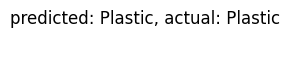

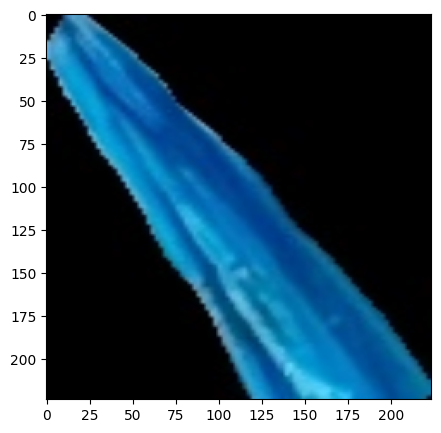

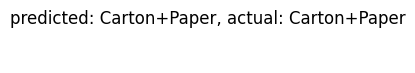

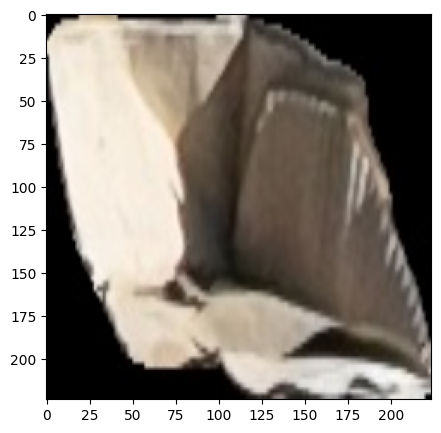

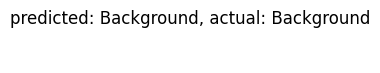

...

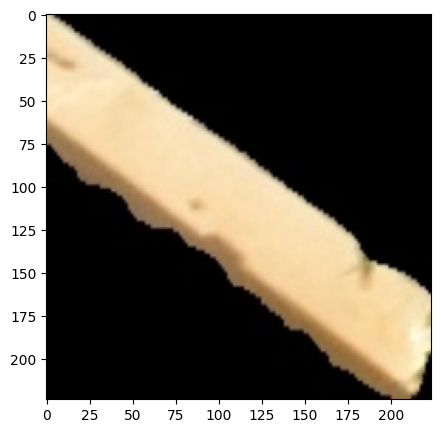

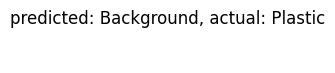

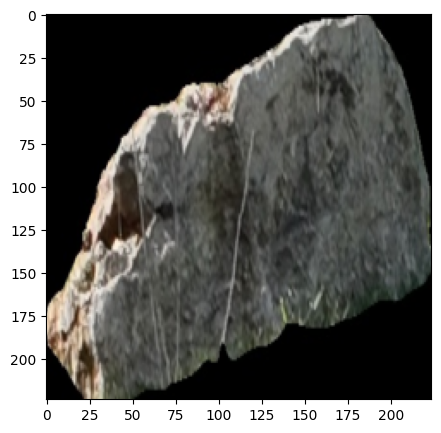

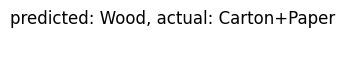

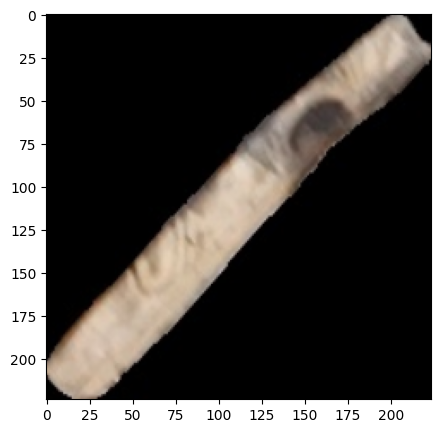

In [ ]:
# visualize_model(model_transfered, num_images=20)
# # plt.legend()
# plt.ioff()
# plt.show()

In [ ]:
def get_wrong_cases(model, dataset):
  model.eval()
  num_right = 0
  for x in dataset:
    inputs = x[0].cuda()
    features = x[1].cuda()
    labels=x[-1].cuda()

    outputs = model((inputs, features))

    _, preds = torch.max(outputs, 1)
    preds= preds.cpu()
    labels = labels.cpu()

    num_right += len(np.where(preds == labels))
    # wrong_indices = np.where(preds != labels)
    # wrong_inputs = inputs[wrong_indices]
    # wrong_features = features[wrong_indices]
    # wrong_labels = labels[wrong_indices]
    #return wrong_inputs, wrong_features, wrong_labels
    # return inputs, features,labels
  return num_right


In [ ]:
with open(f'{folder_path}/{owner}/{image_name}/split_{sp}/seg.json') as f:
  seg = json.load(f)

In [ ]:
very_small_ds_cnt = 0
very_small_ds_right = 0

small_ds_cnt = 0
small_ds_right = 0

medium_ds_cnt = 0
medium_ds_right = 0

large_ds_cnt = 0
large_ds_right = 0

very_large_ds_cnt = 0
very_large_ds_right = 0

regular_ratio_ds_cnt = 0
regular_ratio_ds_right = 0

big_ratio_ds_cnt = 0
big_ratio_ds_right = 0

very_big_ratio_ds_cnt = 0
very_big_ratio_ds_right = 0

good_coverage_ds_cnt = 0
good_coverage_ds_right = 0

medium_coverage_ds_cnt = 0
medium_coverage_ds_right = 0

poor_coverage_ds_cnt = 0
poor_coverage_ds_right = 0



confusion_matrix = torch.zeros(len(reverse_labels_dict), len(reverse_labels_dict))
for imgs, features, labels in dataloaders["test"]:
    # print(inputs, labels)
    imgs = imgs.cuda()
    features = features.cuda()
    labels = labels.cuda()

    with torch.set_grad_enabled(False):
        outputs = model((imgs, features))
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

    for feat, pred in zip(features, preds==labels):
        owner, image, sp, m, size  = sizes[str(feat.cpu())]
        try:
          area = seg[image][f'split_{sp}'][m]['area']
        except:
          print(owner, image, sp, m)
        coverage = area/(size[0]*size[1])
        # print(coverage)
        #coverage checks
        if coverage > 0.7:
            good_coverage_ds_cnt+=1
            good_coverage_ds_right+=pred
        elif coverage > 0.4:
            medium_coverage_ds_cnt+=1
            medium_coverage_ds_right+=pred
        else:
            poor_coverage_ds_cnt+=1
            poor_coverage_ds_right+=pred

        #Size checks
        if size[0]*size[1] <= 5000:
            very_small_ds_cnt+=1
            very_small_ds_right+=pred
        if size[0]*size[1] <= 10000:
            small_ds_cnt+=1
            small_ds_right+=pred
        elif size[0]*size[1] <= 40000:
            medium_ds_cnt+=1
            medium_ds_right+=pred
        elif size[0]*size[1] <= 100000:
            large_ds_cnt+=1
            large_ds_right+=pred
        else:
            very_large_ds_cnt+=1
            very_large_ds_right+=pred

        #Ratio checks
        ratio = max(size[0]/size[1], size[1]/size[0])
        if ratio < 1.5:
            regular_ratio_ds_cnt+=1
            regular_ratio_ds_right+=pred
        elif ratio < 2.5:
            big_ratio_ds_cnt+=1
            big_ratio_ds_right+=pred
        else:
            very_big_ratio_ds_cnt+=1
            very_big_ratio_ds_right+=pred



    for t, p in zip(labels.view(-1), preds.view(-1)):
        confusion_matrix[t.long(), p.long()] += 1


print( f"very small acc: { very_small_ds_right/very_small_ds_cnt}, ({very_small_ds_cnt})")
print( f"small acc: { small_ds_right/small_ds_cnt}, ({small_ds_cnt})")
print( f"medium acc: { medium_ds_right/medium_ds_cnt}, ({medium_ds_cnt})")
print( f"large acc: {large_ds_right/ large_ds_cnt}, ({large_ds_cnt})")
print( f"very large acc: { very_large_ds_right/very_large_ds_cnt}, ({very_large_ds_cnt})")

print( f"regular ratio acc: { regular_ratio_ds_right/regular_ratio_ds_cnt}, ({regular_ratio_ds_cnt})")
print( f"big ratio acc: { big_ratio_ds_right/big_ratio_ds_cnt}, ({big_ratio_ds_cnt})")
print( f"very big ratio acc: { very_big_ratio_ds_right/very_big_ratio_ds_cnt}, ({very_big_ratio_ds_cnt})")

print( f"good coverage acc: { good_coverage_ds_right/good_coverage_ds_cnt}, ({good_coverage_ds_cnt})")
print( f"medium coverage acc: { medium_coverage_ds_right/medium_coverage_ds_cnt}, ({medium_coverage_ds_cnt})")
print( f"poor coverage acc: { poor_coverage_ds_right/poor_coverage_ds_cnt}, ({poor_coverage_ds_cnt})")

# print(confusion_matrix)

group_counts = ["{0: 0.0f}".format(value) for value in confusion_matrix.flatten()]
labels = [f"{v1}" for v1 in group_counts]
labels = np.asarray(labels).reshape(len(reverse_labels_dict), len(reverse_labels_dict))
sns.heatmap(confusion_matrix, annot=labels, fmt='', cmap='Blues',
            xticklabels=reverse_labels_dict.values(), yticklabels=reverse_labels_dict.values())
plt.show()

In [ ]:
# from tqdm import tqdm

# def calc_amount_correct(model, dataset):
#   model.eval()
#   num_right = 0
#   for owner, image_name, sp, m in tqdm(dataset):
#     img = cv2.imread(f'{folder_path}/{owner}/{image_name}/split_{sp}/{m}.jpg')
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     im_pil = Image.fromarray(img)

#     preprocess0 = transforms.Compose([
#     transforms.Resize((224,224)),

#     transforms.ToTensor()
#     ])
#     preprocess1 = transforms.Compose([
#     transforms.Resize((224,224)),

#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
#     ])

#     if NORMALIZE:
#         input_tensor = preprocess1(im_pil)
#     else:
#         input_tensor = preprocess0(im_pil)

#     label = json_dict1[image_name][sp][m]
#     y = labels_dict[label]

#     inputs = input_tensor.unsqueeze(-1).cuda()
#     # features = x[1].cuda()
#     features = torch.Tensor([])
#     labels=torch.Tensor(y)

#     outputs = model((inputs, features))

#     _, preds = torch.max(outputs, 1)
#     preds= preds.cpu()
#     labels = labels.cpu()

#     num_right += preds[0]==labels[0]
#     # wrong_indices = np.where(preds != labels)
#     # wrong_inputs = inputs[wrong_indices]
#     # wrong_features = features[wrong_indices]
#     # wrong_labels = labels[wrong_indices]
#     #return wrong_inputs, wrong_features, wrong_labels
#     # return inputs, features,labels
  # return num_right

In [ ]:
# bad_predictions = get_wrong_cases(model)

In [ ]:
#Size success comparison:
for name, ds in size_ds.items():
  print(name)
  right = calc_amount_correct(model_transfered, ds)
  print(f'Got {right/len(ds)} right')

In [ ]:
for ds in ratio_ds:

In [ ]:
for ds in coverage_ds:

In [ ]:
outputs = model((bad_predictions[0], bad_predictions[1]))
outputs = outputs.softmax(1)
# _, preds = torch.max(outputs, 1)

In [ ]:
def plot_image(predictions_array, true_label, img):
  # true_label, img = true_label[i], img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}% ({})".format(reverse_labels_dict[predicted_label],
                                100*np.max(predictions_array),
                                reverse_labels_dict[true_label]),
                                color=color)
  img = img.numpy().transpose((1, 2, 0))
  if NORMALIZE:
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
  img = np.clip(img, 0, 1)
  plt.imshow(img)



def plot_value_array(predictions_array, true_label):
  # true_label = true_label[i]
  plt.grid(False)
  plt.xticks(range(len(reverse_labels_dict)), rotation=285)
  plt.yticks(np.arange(0,1.0, 0.1))
  thisplot = plt.bar([reverse_labels_dict[i] for i in range(7)], predictions_array, color="#777777")
  plt.ylim([0, 1])
  predicted_label = np.argmax(predictions_array)

  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')
# i = 2
# # plt.figure(figsize=(6,6))
# plt.subplot(1,2,1)
# plot_image(i, outputs.cpu().detach().numpy()[i], bad_predictions[2].cpu().detach().numpy(), bad_predictions[0].cpu())
# plt.subplot(1,2,2)
# plot_value_array(i, outputs.cpu().detach().numpy()[i],  bad_predictions[2].cpu())
# plt.show()

64 wrong of 64:
('Yoni', 'DJI_20230221091256_0084_V', 9, 'mask_79', (214, 80))


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


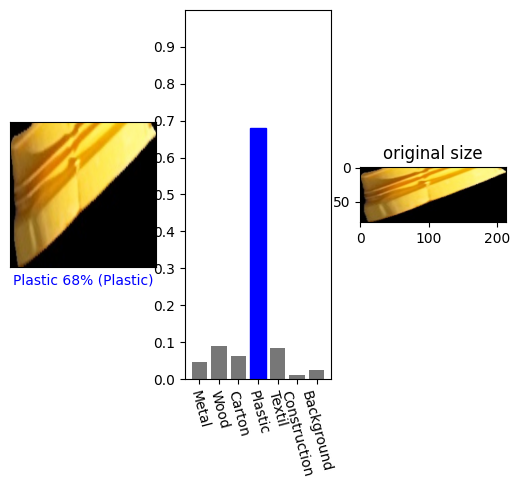

('Adi', 'DJI_20230221095630_0096_V', 5, 'mask_9', (167, 54))


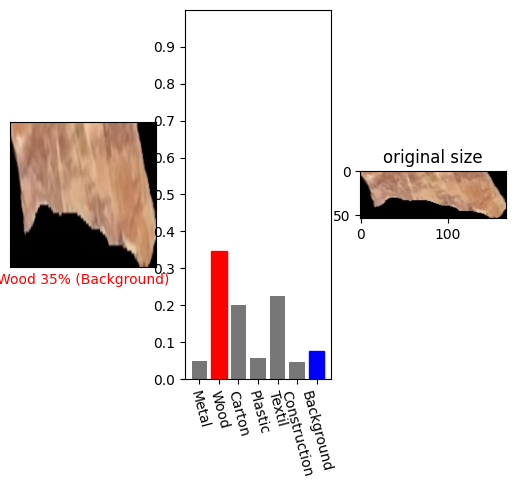

('Yoni', 'DJI_20230221091125_0053_V', 5, 'mask_9', (200, 176))


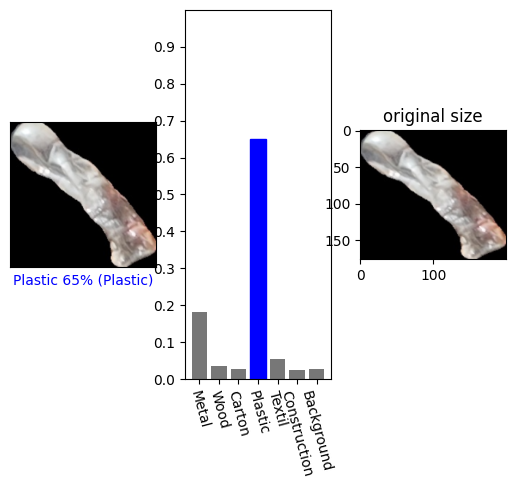

('Arik', 'DJI_20230221095615_0090_V', 0, 'mask_42', (202, 41))


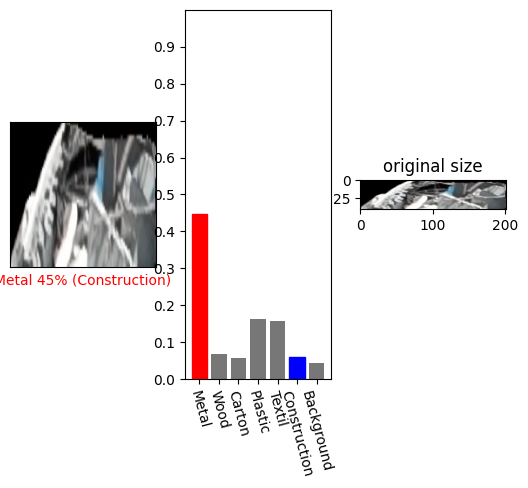

('Yoni', 'DJI_20230221095523_0076_V', 2, 'mask_14', (71, 243))


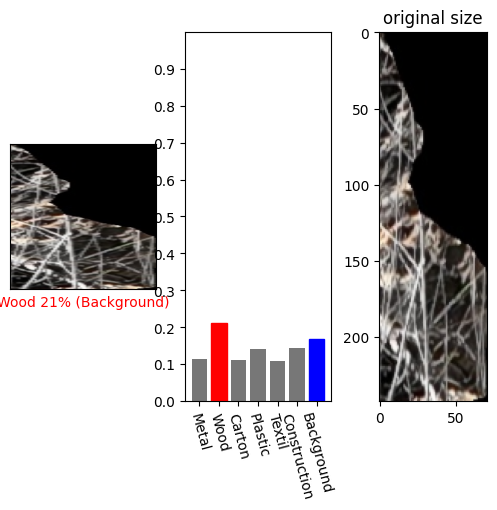

('Adi', 'DJI_20230221095408_0051_V', 2, 'mask_17', (109, 91))


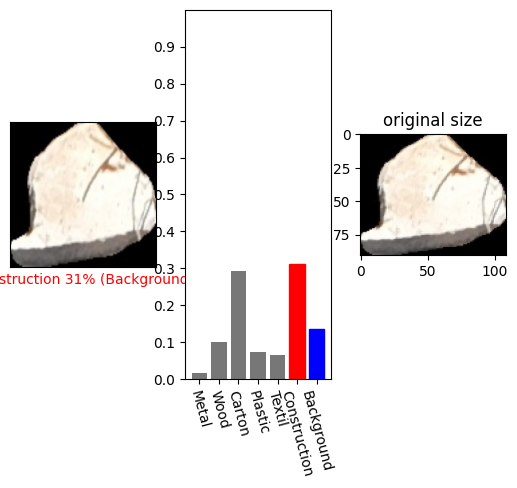

('Arik', 'DJI_20230221081744_0017_V', 2, 'mask_17', (281, 253))


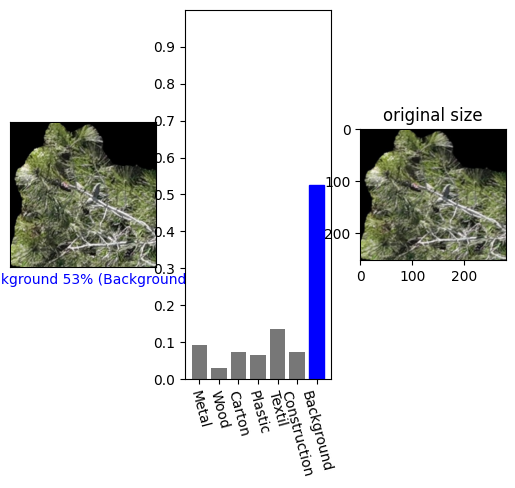

('Arik', 'DJI_20230221091035_0034_V', 6, 'mask_121', (62, 60))


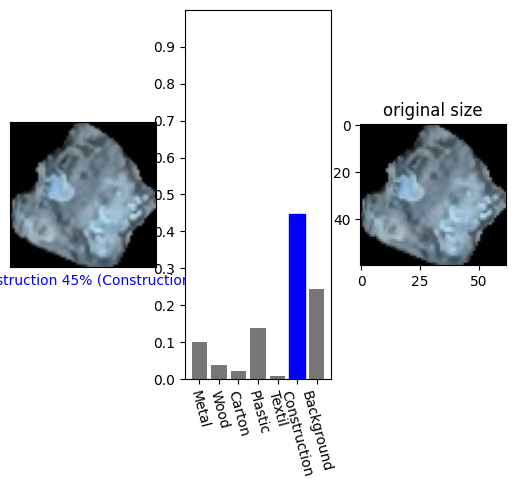

('Yoni', 'DJI_20230221095512_0069_V', 8, 'mask_64', (473, 316))


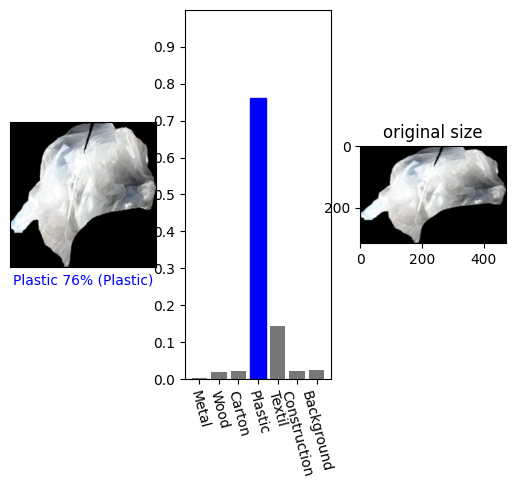

('Yoni', 'DJI_20230221091309_0089_V', 6, 'mask_27', (292, 213))


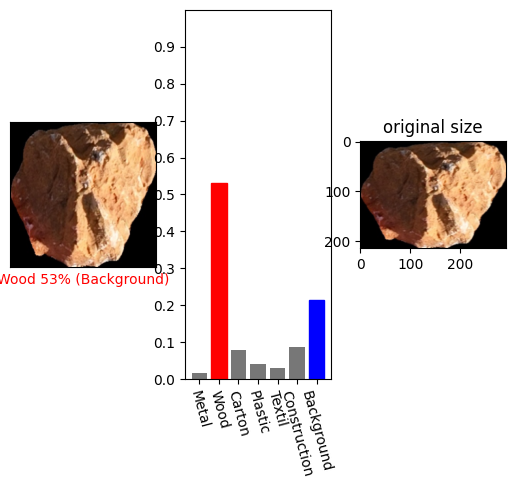

('Yoni', 'DJI_20230221091125_0053_V', 6, 'mask_30', (101, 54))


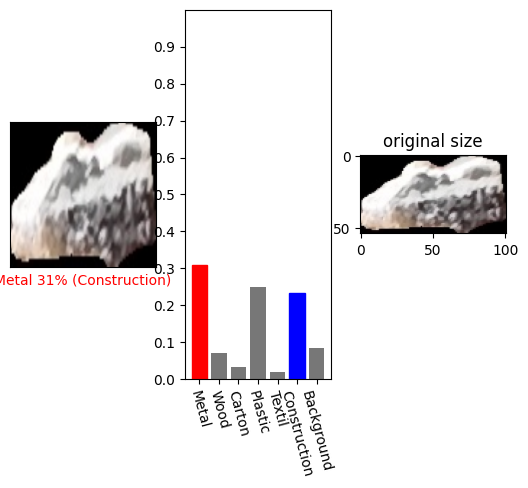

('Arik', 'DJI_20230221091035_0034_V', 1, 'mask_123', (66, 57))


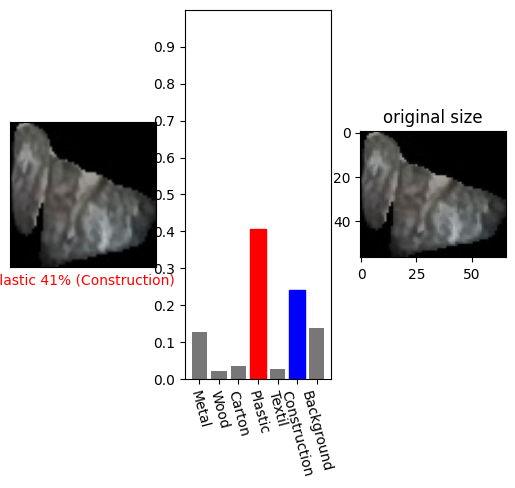

('Adi', 'DJI_20230221095237_0023_V', 4, 'mask_39', (57, 48))


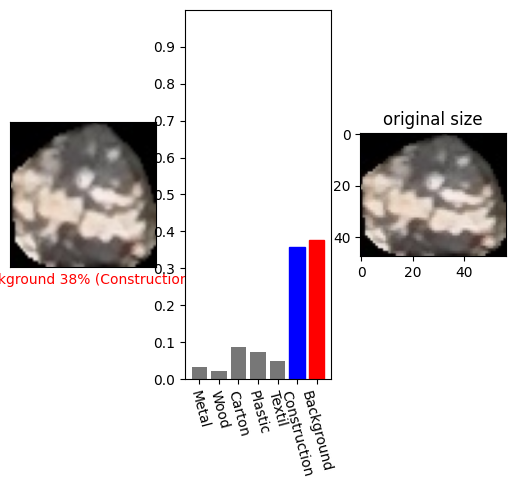

('Arik', 'DJI_20230221095213_0011_V', 14, 'mask_5', (101, 64))


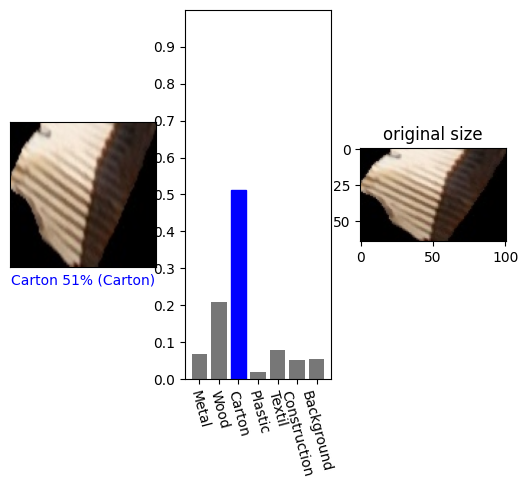

('Arik', 'DJI_20230221100213_0123_V', 8, 'mask_4', (180, 160))


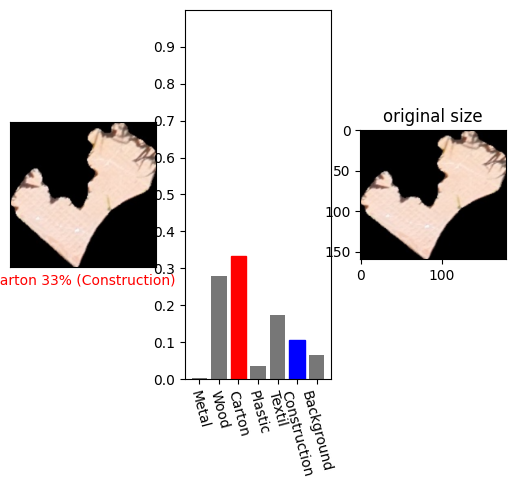

('Adi', 'DJI_20230221095237_0023_V', 9, 'mask_31', (149, 191))


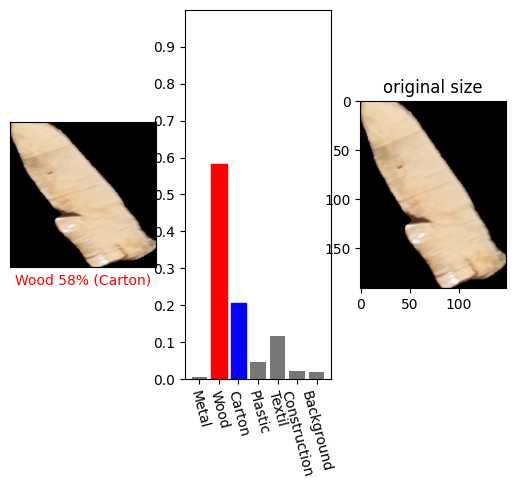

('Arik', 'DJI_20230221100213_0123_V', 6, 'mask_21', (143, 128))


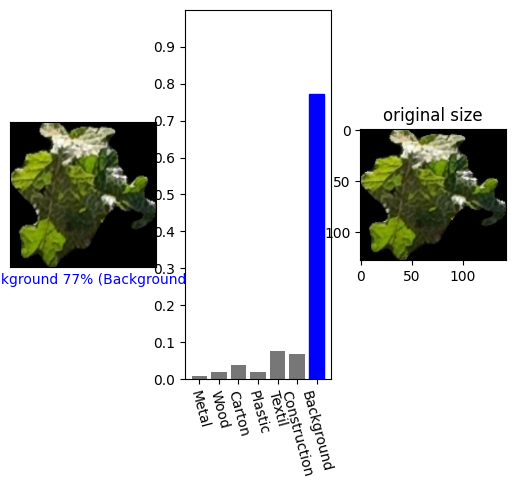

('Arik', 'DJI_20230221091035_0034_V', 0, 'mask_9', (129, 98))


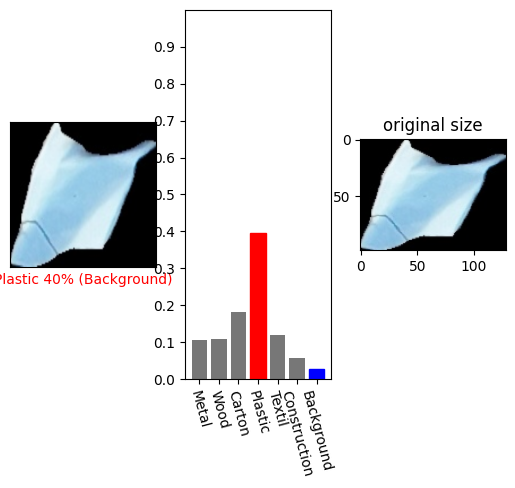

('Yoni', 'DJI_20230221095523_0076_V', 8, 'mask_4', (78, 78))


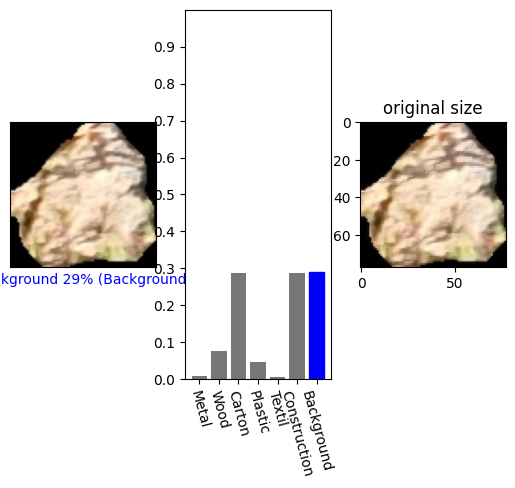

('Arik', 'DJI_20230221095459_0062_V', 1, 'mask_20', (145, 61))


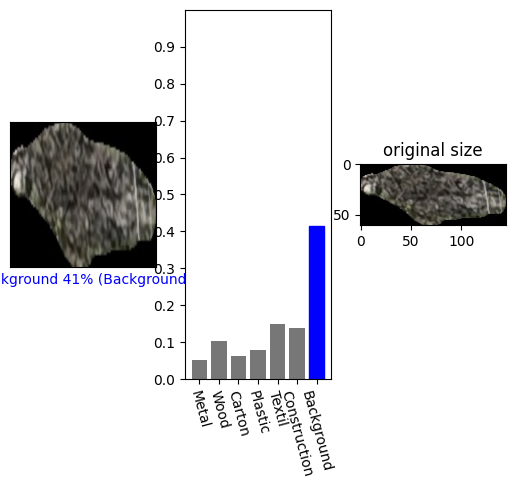

('Adi', 'DJI_20230221095511_0068_V', 1, 'mask_2', (138, 95))


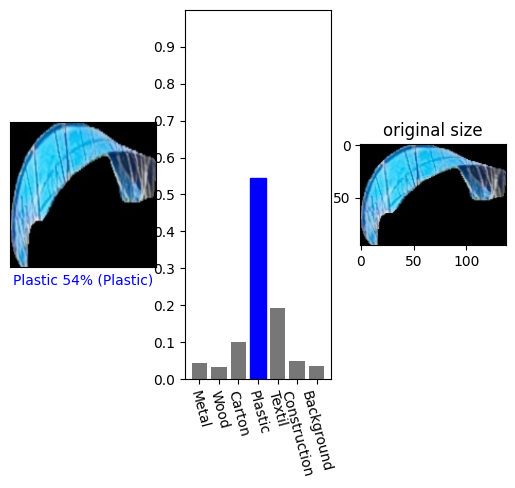

('Yoni', 'DJI_20230221093958_0112_V', 1, 'mask_25', (86, 108))


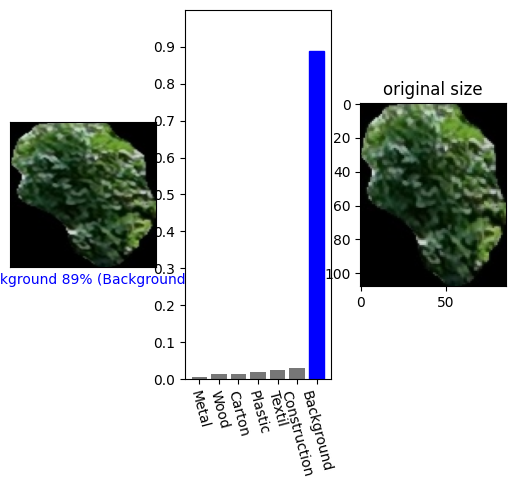

('Yoni', 'DJI_20230221095523_0076_V', 13, 'mask_5', (1319, 779))


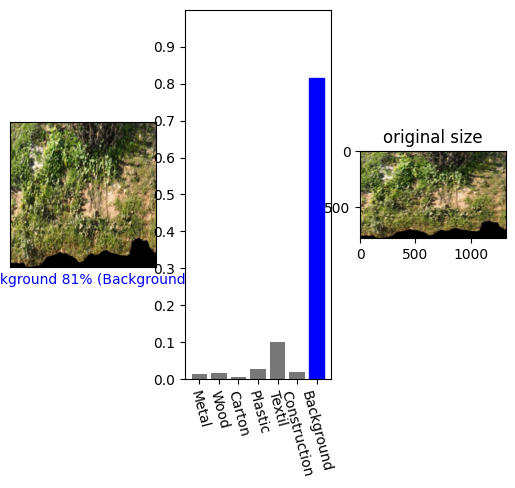

('Adi', 'DJI_20230221095408_0051_V', 0, 'mask_52', (58, 143))


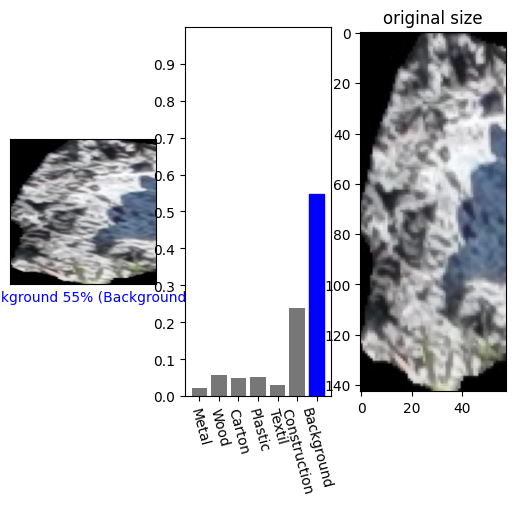

('Arik', 'DJI_20230221095213_0011_V', 10, 'mask_15', (152, 117))


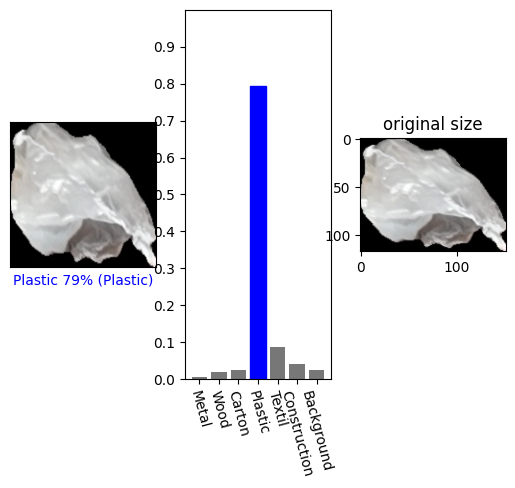

('Arik', 'DJI_20230221081744_0017_V', 13, 'mask_9', (133, 144))


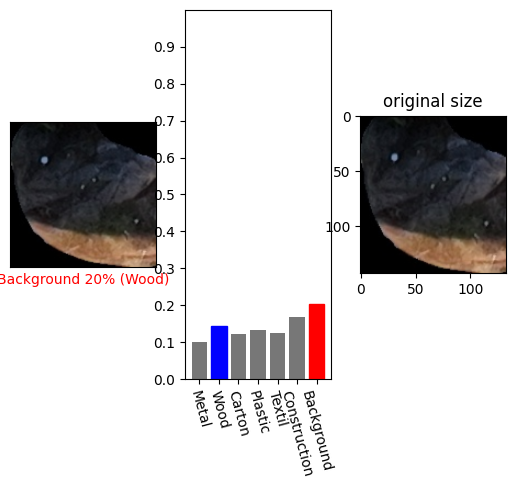

('Yoni', 'DJI_20230221091056_0043_V', 4, 'mask_11', (73, 165))


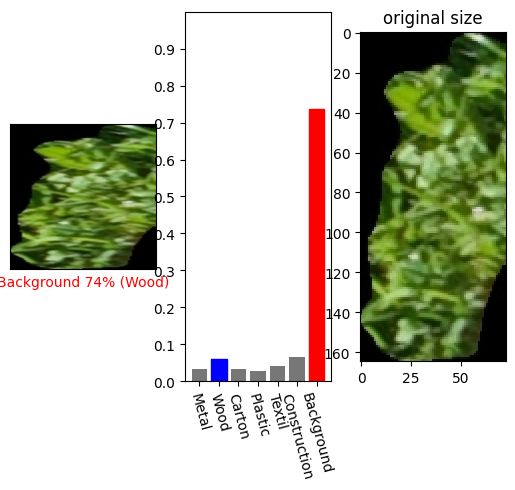

('Adi', 'DJI_20230221095630_0096_V', 7, 'mask_21', (201, 88))


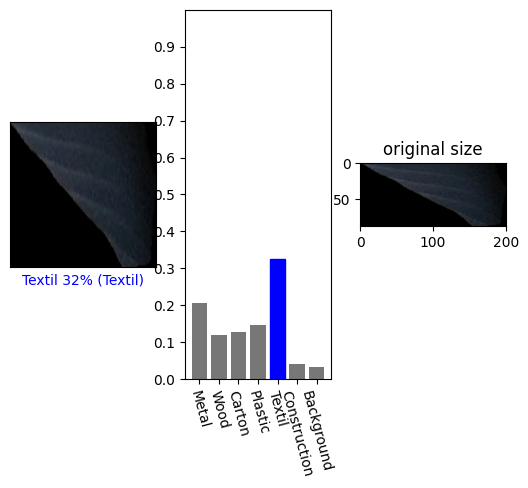

('Yoni', 'DJI_20230221091042_0037_V', 1, 'mask_55', (71, 224))


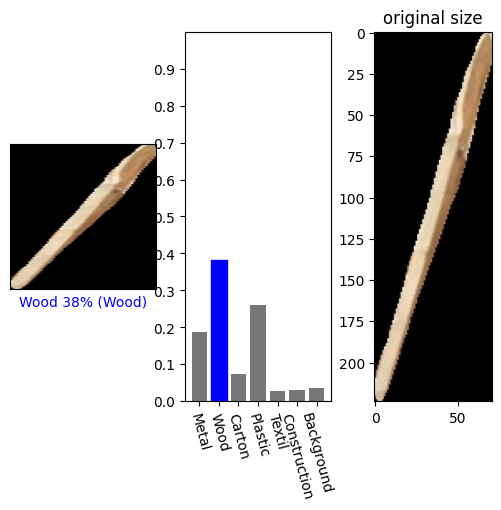

('Arik', 'DJI_20230221095459_0062_V', 9, 'mask_25', (292, 261))


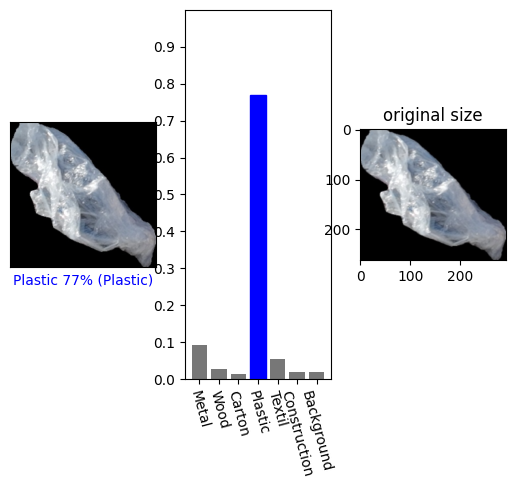

('Adi', 'DJI_20230221095237_0023_V', 13, 'mask_81', (101, 99))


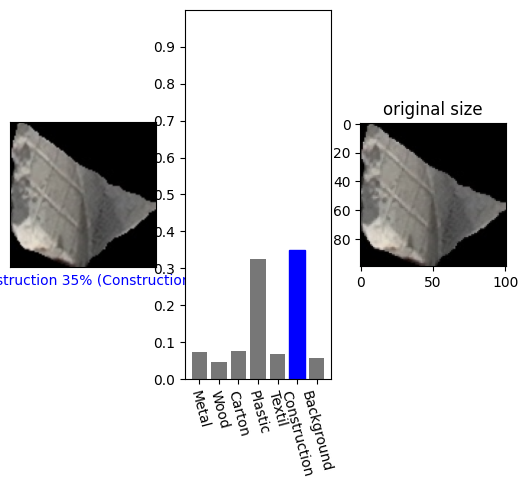

('Adi', 'DJI_20230221095408_0051_V', 8, 'mask_25', (62, 83))


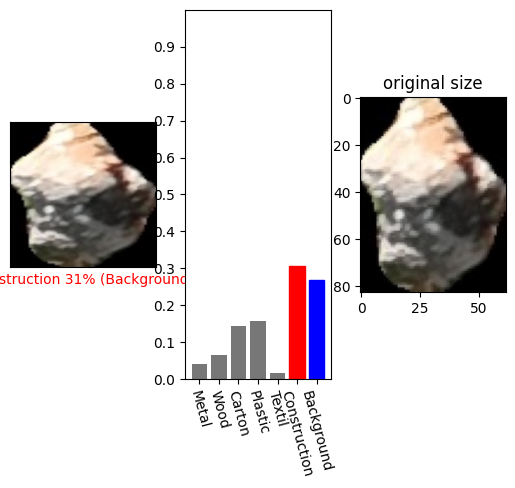

('Yoni', 'DJI_20230221095512_0069_V', 1, 'mask_9', (124, 71))


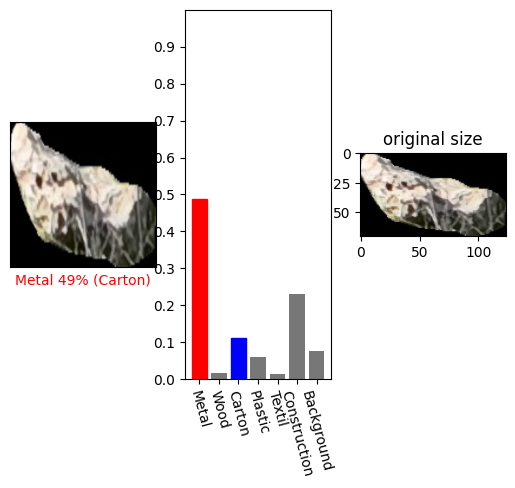

('Arik', 'DJI_20230221100215_0124_V', 6, 'mask_22', (60, 117))


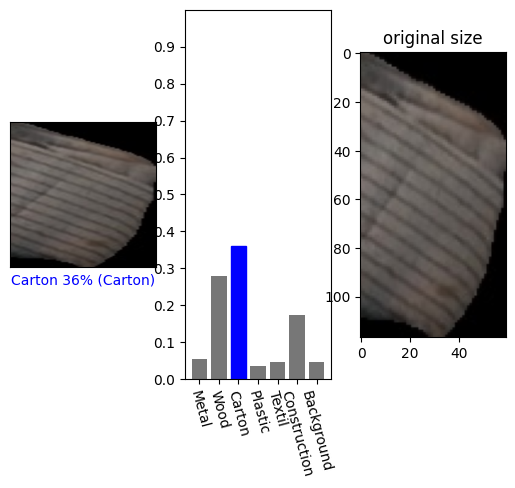

('Yoni', 'DJI_20230221091256_0084_V', 6, 'mask_99', (202, 110))


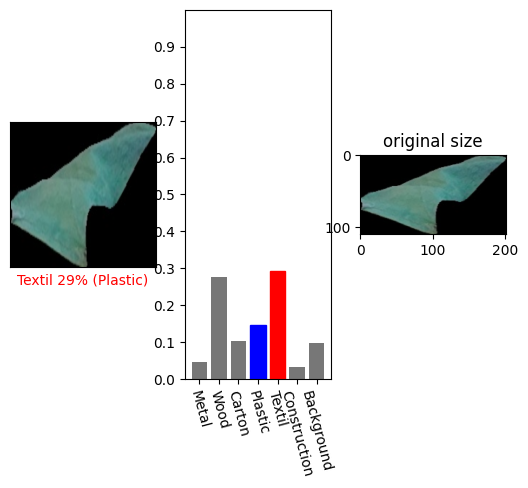

('Arik', 'DJI_20230221100213_0123_V', 1, 'mask_8', (87, 246))


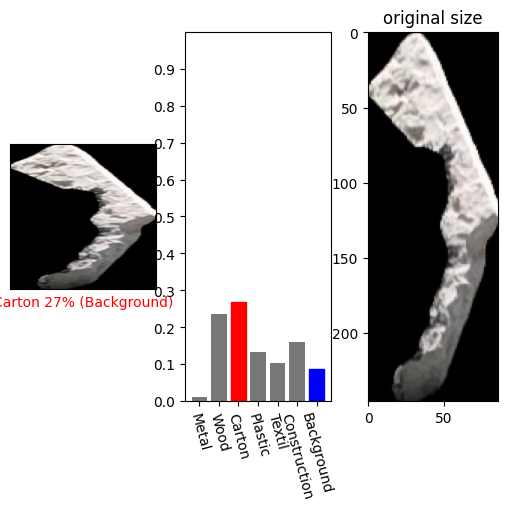

('Arik', 'DJI_20230221091035_0034_V', 1, 'mask_100', (77, 52))


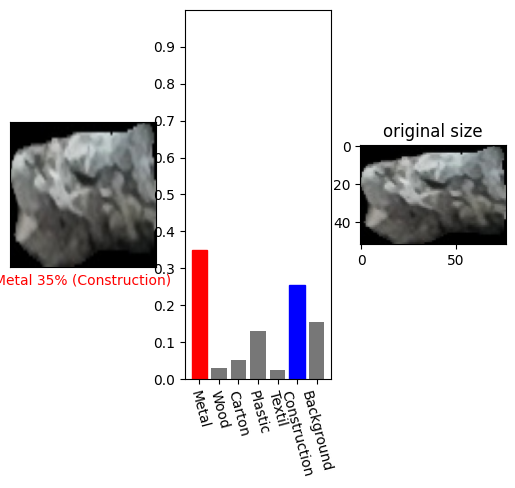

('Arik', 'DJI_20230221095459_0062_V', 2, 'mask_9', (99, 122))


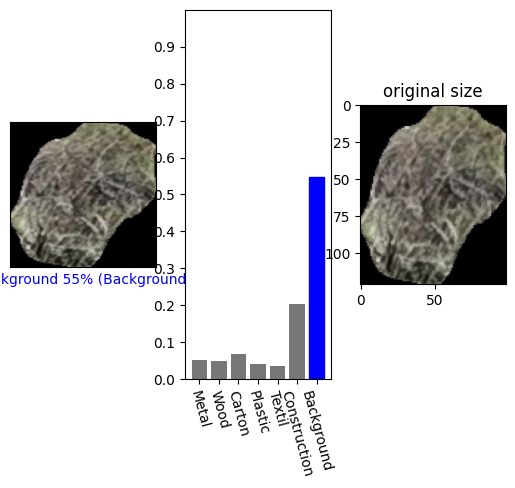

('Arik', 'DJI_20230221100213_0123_V', 9, 'mask_53', (289, 227))


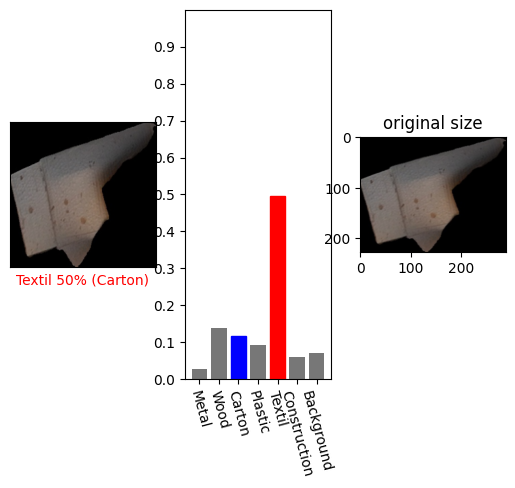

('Adi', 'DJI_20230221095630_0096_V', 7, 'mask_24', (255, 179))


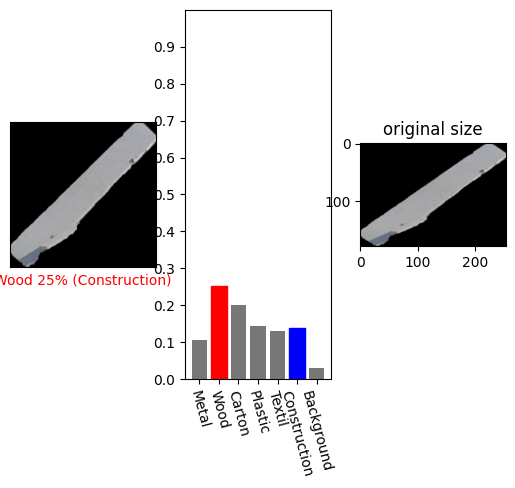

('Arik', 'DJI_20230221095213_0011_V', 1, 'mask_23', (128, 210))


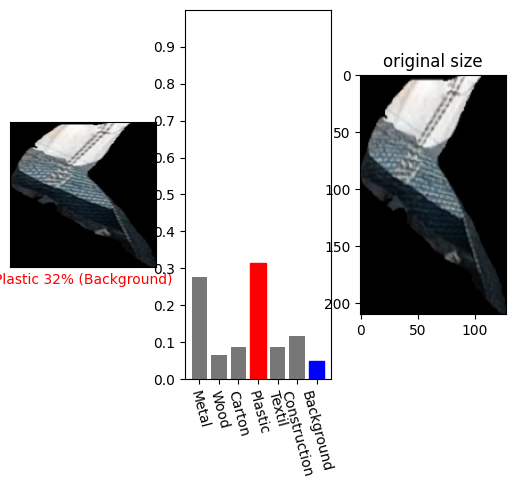

('Arik', 'DJI_20230221100213_0123_V', 5, 'mask_92', (58, 95))


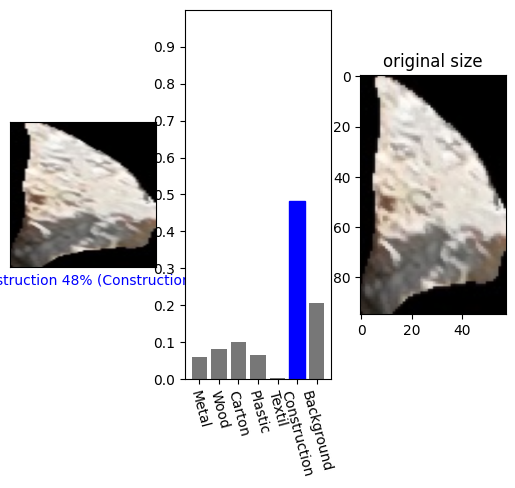

('Arik', 'DJI_20230221081744_0017_V', 3, 'mask_2', (50, 78))


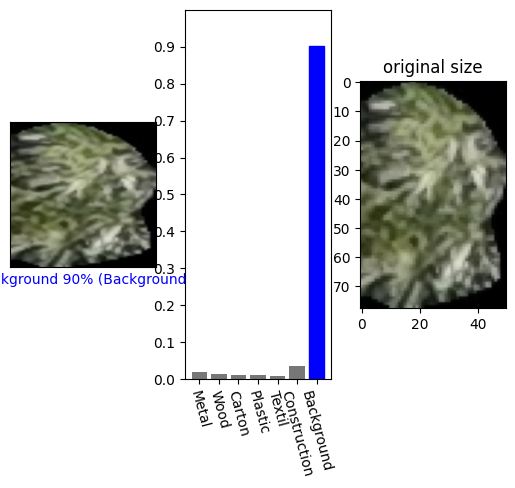

('Yoni', 'DJI_20230221091056_0043_V', 8, 'mask_11', (112, 106))


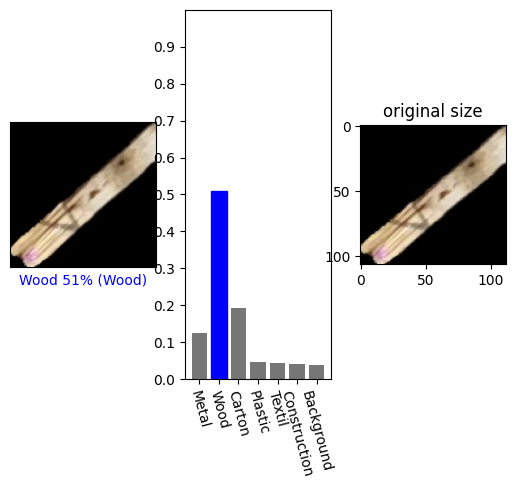

('Yoni', 'DJI_20230221091256_0084_V', 3, 'mask_69', (82, 81))


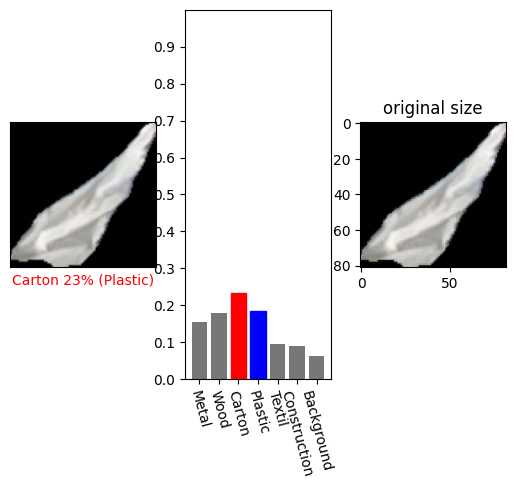

('Arik', 'DJI_20230221095459_0062_V', 2, 'mask_37', (97, 45))


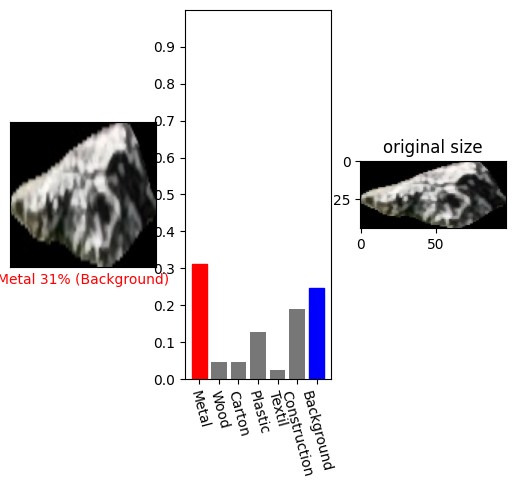

('Arik', 'DJI_20230221091850_0113_V', 2, 'mask_7', (67, 146))


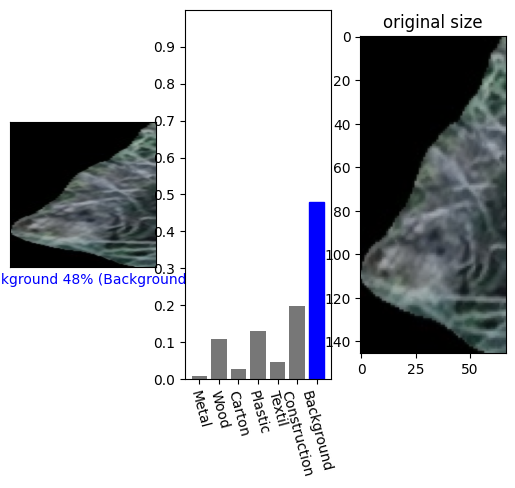

('Arik', 'DJI_20230221095615_0090_V', 4, 'mask_25', (50, 70))


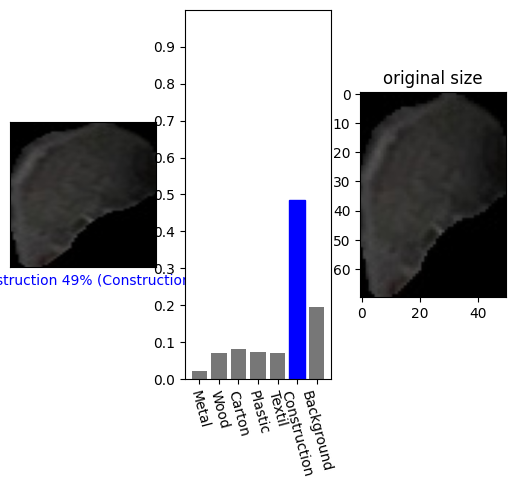

('Yoni', 'DJI_20230221095512_0069_V', 2, 'mask_17', (237, 237))


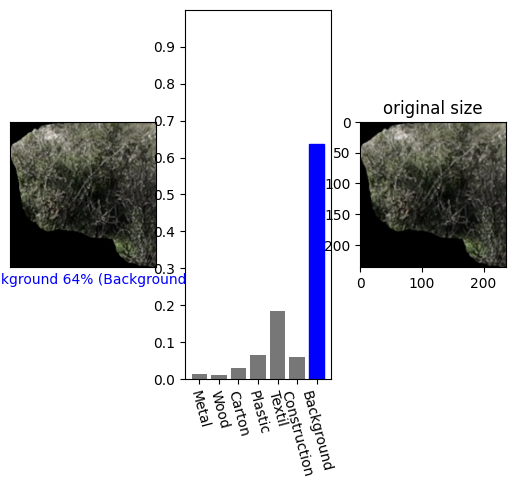

('Yoni', 'DJI_20230221091256_0084_V', 3, 'mask_17', (147, 118))


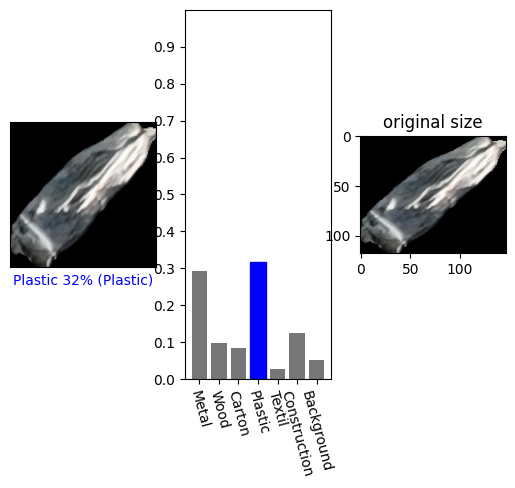

('Adi', 'DJI_20230221095408_0051_V', 10, 'mask_80', (54, 72))


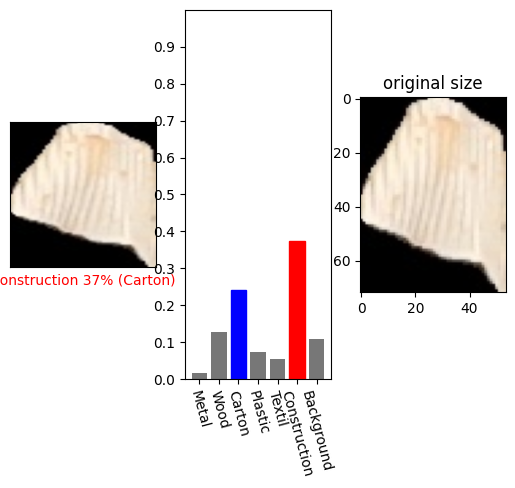

('Adi', 'DJI_20230221095237_0023_V', 4, 'mask_26', (280, 95))


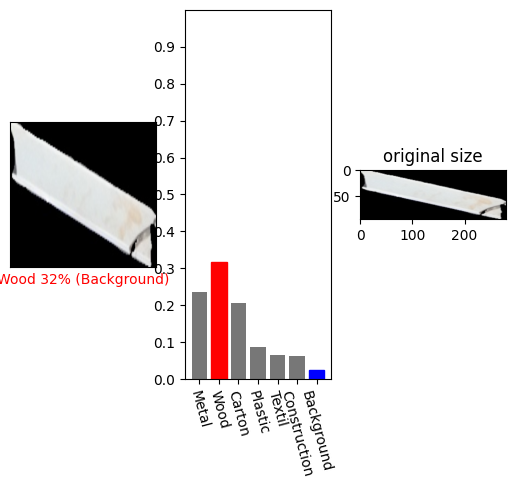

('Adi', '20230215_093545', 11, 'mask_2', (116, 86))


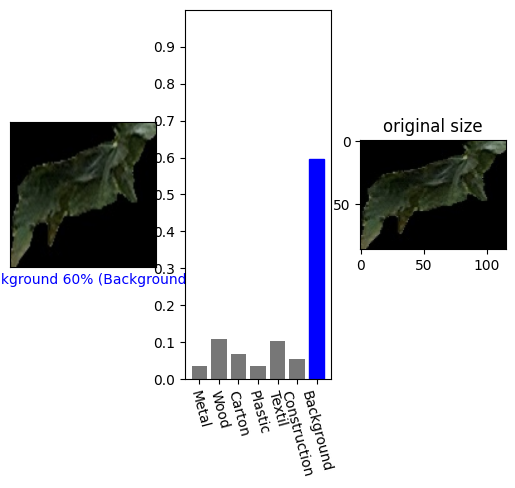

('Arik', 'DJI_20230221095459_0062_V', 6, 'mask_69', (67, 57))


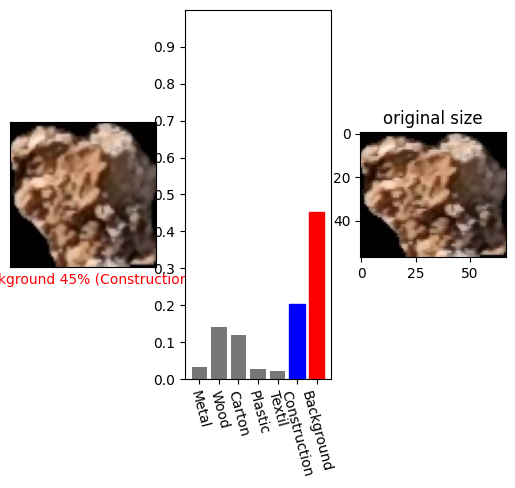

('Yoni', 'DJI_20230221091254_0083_V', 1, 'mask_5', (365, 309))


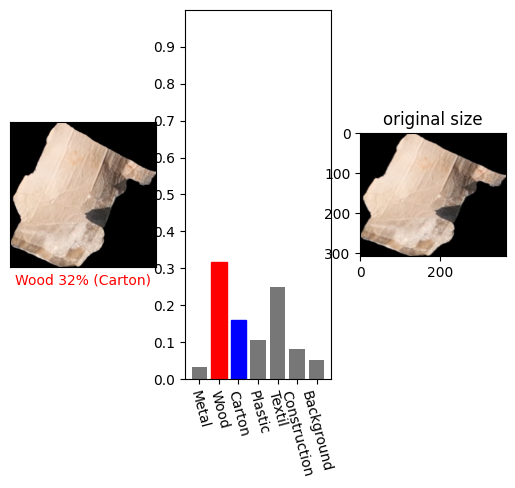

('Arik', 'DJI_20230221095213_0011_V', 1, 'mask_30', (115, 62))


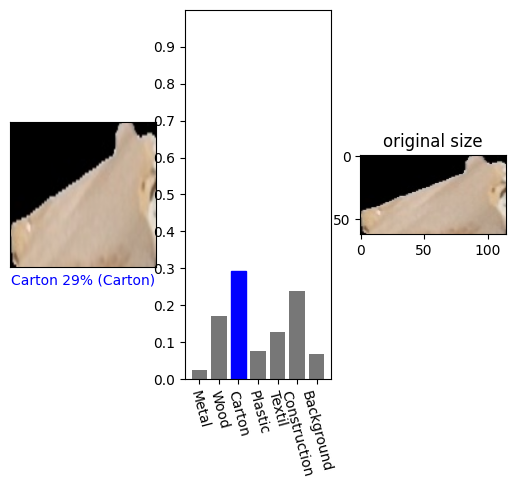

('Yoni', 'DJI_20230221095512_0069_V', 8, 'mask_61', (165, 100))


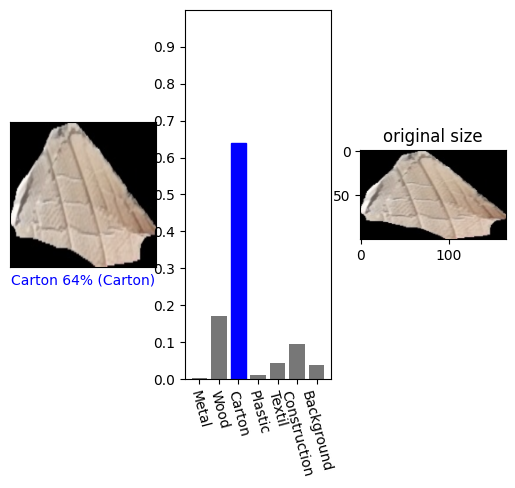

('Adi', 'DJI_20230221095224_0017_V', 8, 'mask_1', (36, 803))


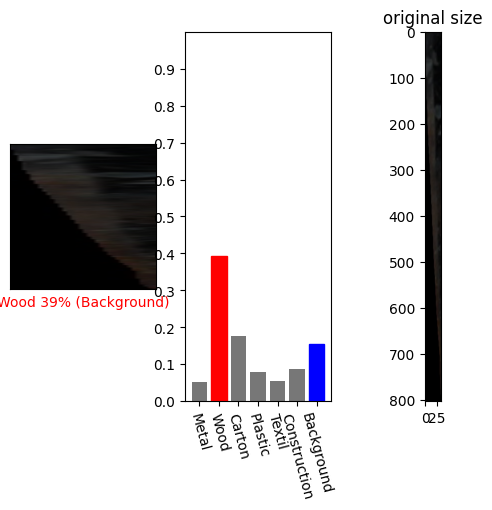

('Adi', 'DJI_20230221095259_0031_V', 8, 'mask_5', (163, 342))


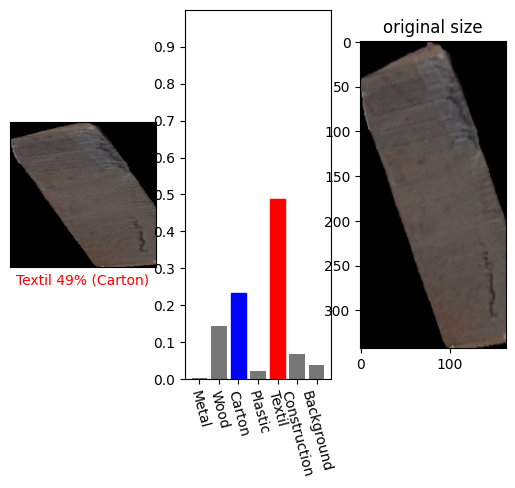

('Adi', 'DJI_20230221095511_0068_V', 6, 'mask_39', (100, 66))


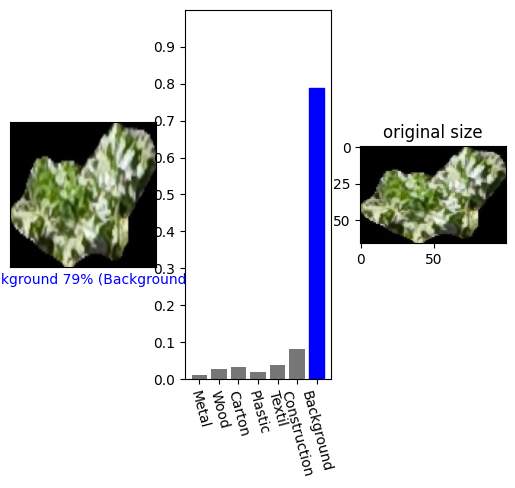

('Adi', 'DJI_20230221095630_0096_V', 9, 'mask_16', (112, 160))


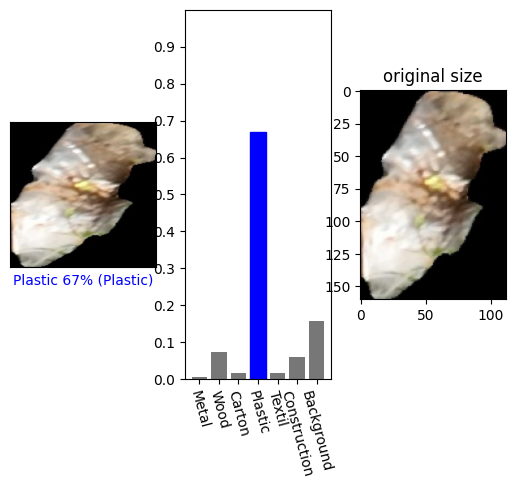

('Yoni', 'DJI_20230221095512_0069_V', 11, 'mask_35', (98, 144))


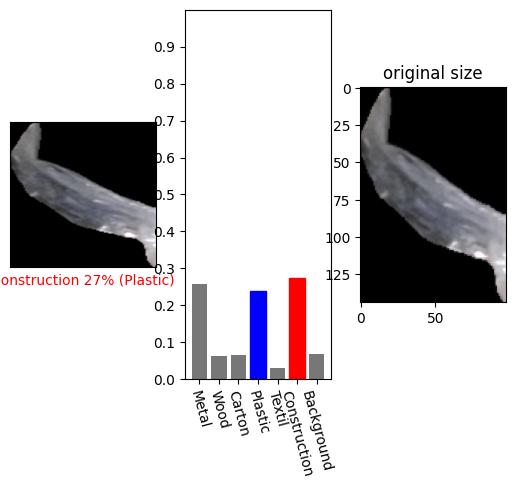

('Yoni', 'DJI_20230221091125_0053_V', 6, 'mask_73', (45, 84))


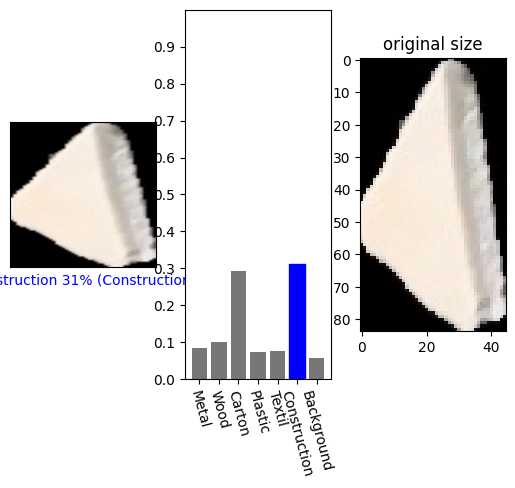

('Adi', 'DJI_20230221095630_0096_V', 3, 'mask_12', (155, 116))


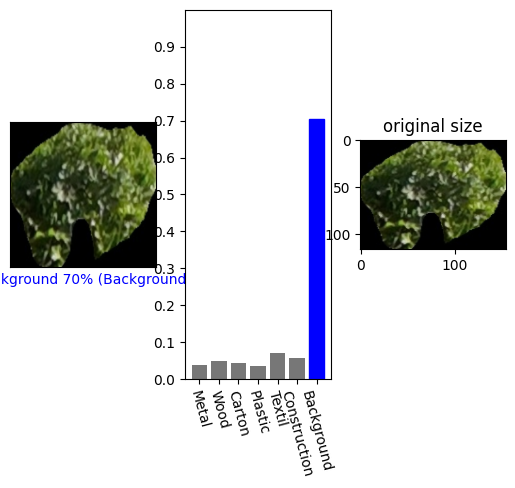

In [ ]:
import scipy.special
outputs = model((bad_predictions[0], bad_predictions[1]))
_, preds = torch.max(outputs, 1)
outputs = outputs.cpu().detach().numpy()
outputs = np.array(outputs)
# print(outputs)
outputs = scipy.special.softmax(outputs,1)
print(f'{len(outputs)} wrong of 64:')
# _, preds = torch.max(outputs, 1)
# print(sizes)
# print(zip(bad_predictions, preds))
for im, feat, lab, pred, out in zip(bad_predictions[0], bad_predictions[1], bad_predictions[2], preds, outputs):
  # print()
  im = im.cpu()
  s = sizes[f'{feat.cpu()}']
  print(s)
  t = transforms.Resize((s[-1][1], s[-1][0]))
  im2 = t(im)
  # imshow(plt, im, f'predicted: {[i.item() for i in out]}, {reverse_labels_dict[pred.item()]}, actual: {reverse_labels_dict[lab.item()]}')

  plt.subplot(1,3,1)
  plot_image(out, lab.item(), im.cpu())
  plt.subplot(1,3,2)
  plot_value_array(out,  lab.item())
  plt.subplot(1,3,3)
  imshow(im2, 'original size')
  # plt.tight_layout(pad=50)
  # plt.subplot_tool()
  plt.show()


64 wrong of 64:
('Adi', 'DJI_20230221095237_0023_V', 11, 'mask_21', (135, 206))


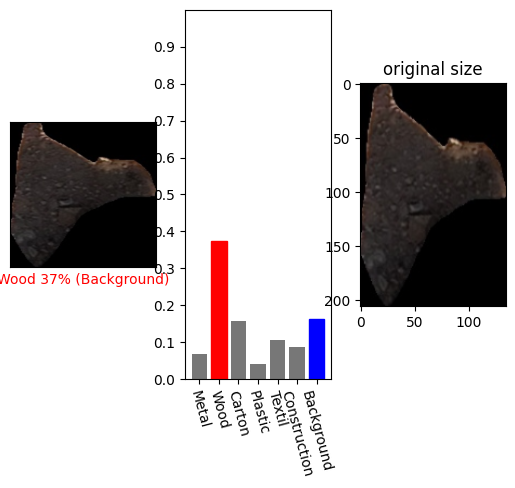

('Yoni', 'DJI_20230221095235_0022_V', 0, 'mask_17', (107, 69))


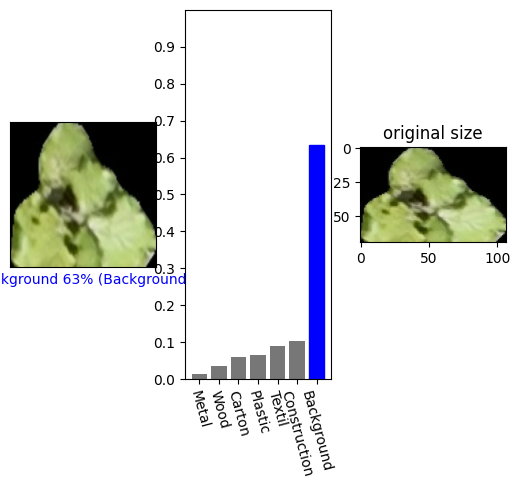

('Yoni', 'DJI_20230221095523_0076_V', 9, 'mask_2', (166, 207))


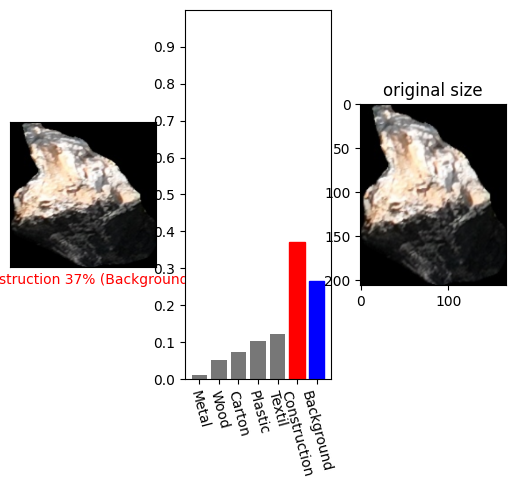

('Arik', 'DJI_20230221095615_0090_V', 4, 'mask_25', (50, 70))


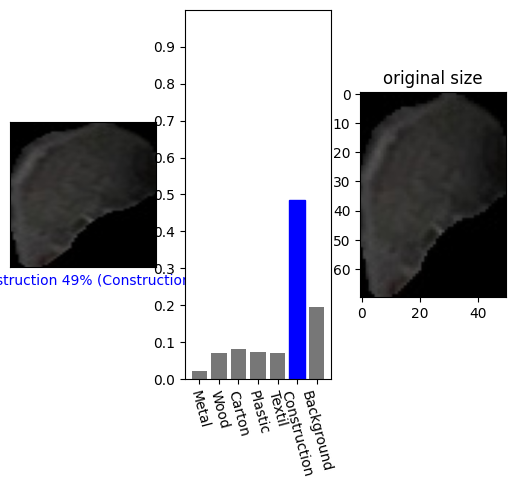

('Yoni', 'DJI_20230221095512_0069_V', 11, 'mask_37', (96, 136))


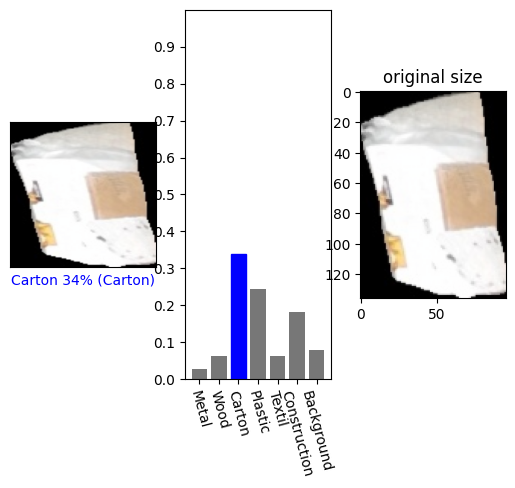

('Adi', 'DJI_20230221095630_0096_V', 3, 'mask_14', (126, 104))


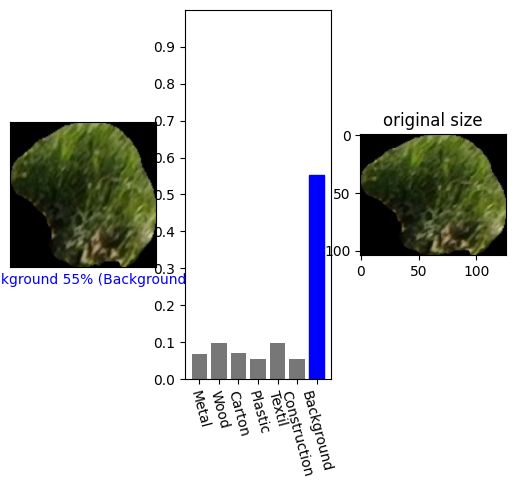

('Yoni', 'DJI_20230221095235_0022_V', 0, 'mask_14', (222, 216))


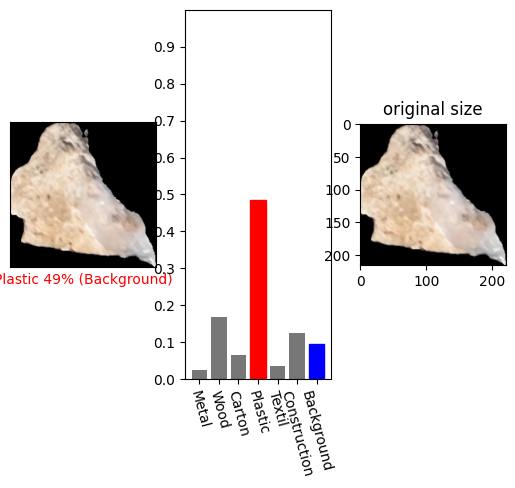

('Arik', 'DJI_20230221091035_0034_V', 3, 'mask_14', (104, 31))


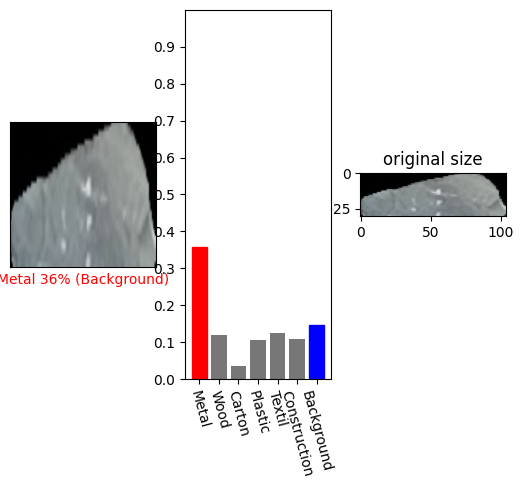

('Arik', 'DJI_20230221100215_0124_V', 12, 'mask_5', (110, 151))


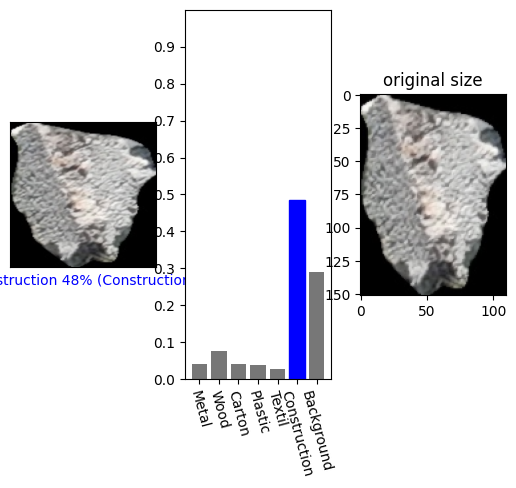

('Arik', 'DJI_20230221081744_0017_V', 1, 'mask_15', (111, 44))


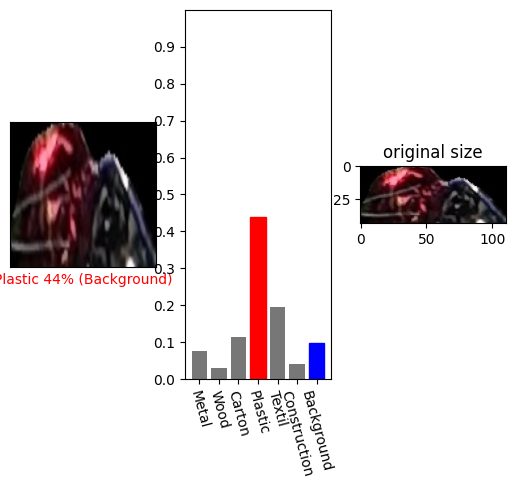

('Yoni', 'DJI_20230221095228_0020_V', 1, 'mask_35', (142, 127))


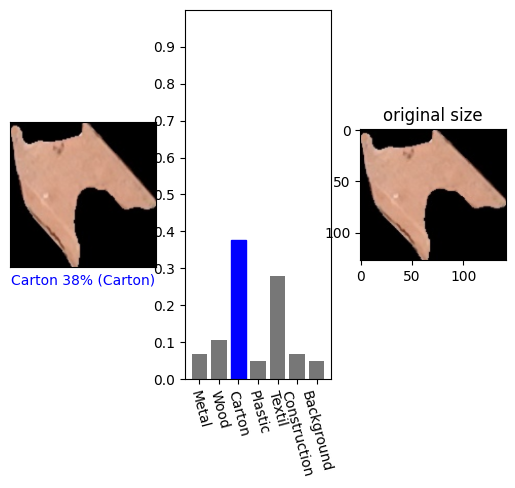

('Yoni', 'DJI_20230221091300_0086_V', 0, 'mask_25', (201, 84))


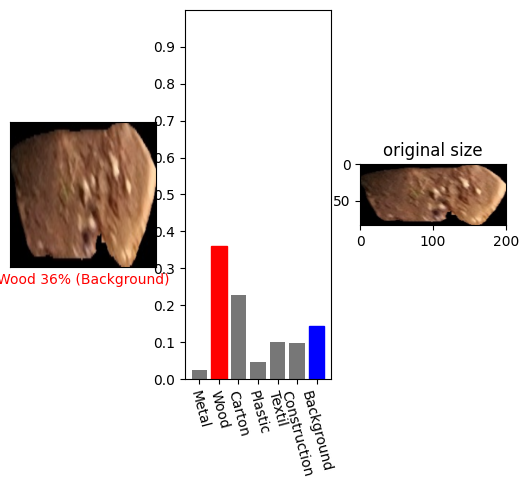

('Arik', 'DJI_20230221091035_0034_V', 4, 'mask_36', (254, 160))


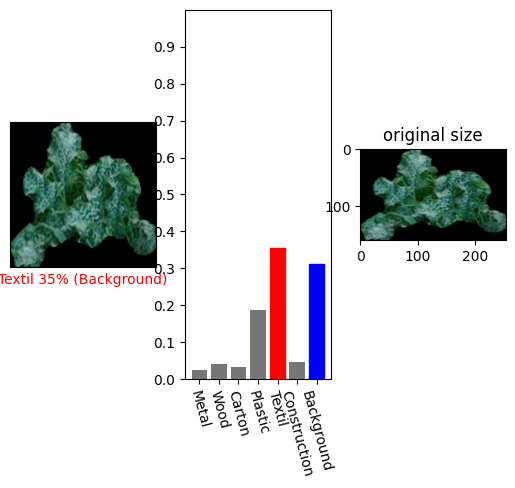

('Adi', 'DJI_20230221095224_0017_V', 13, 'mask_39', (71, 61))


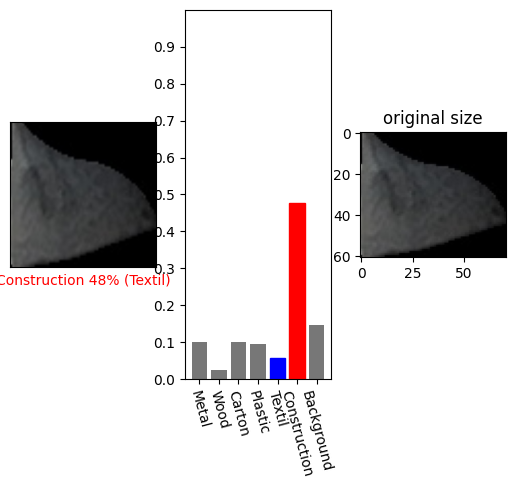

('Arik', 'DJI_20230221095459_0062_V', 1, 'mask_28', (143, 33))


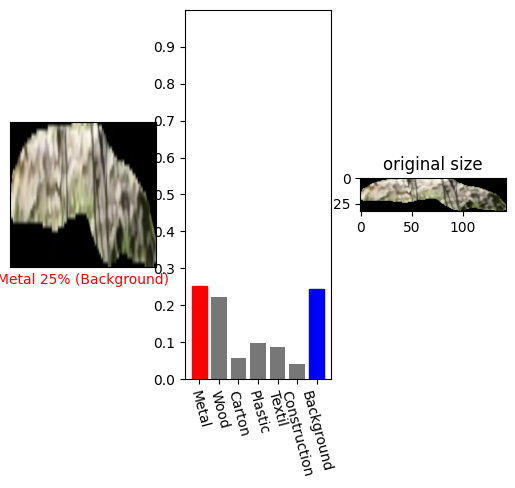

('Adi', 'DJI_20230221095630_0096_V', 5, 'mask_77', (38, 167))


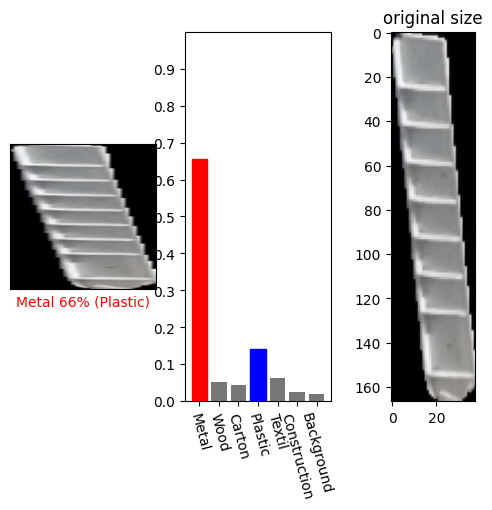

('Arik', 'DJI_20230221095459_0062_V', 9, 'mask_27', (88, 217))


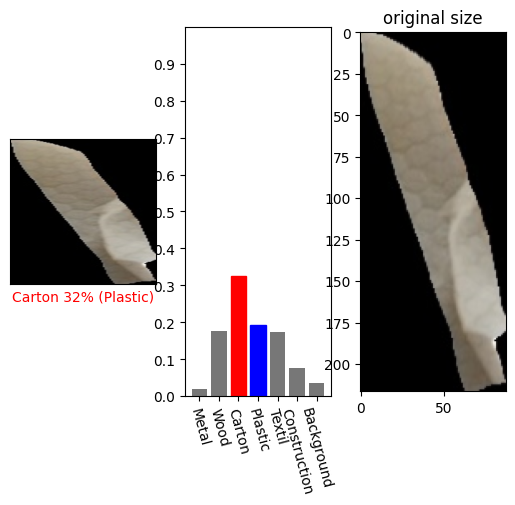

('Yoni', 'DJI_20230221091056_0043_V', 5, 'mask_28', (134, 79))


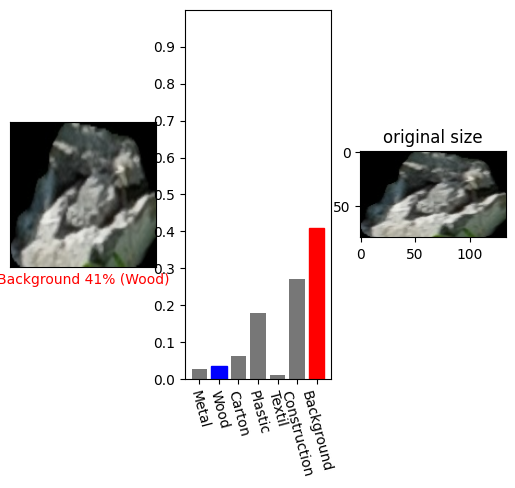

('Arik', 'DJI_20230221091035_0034_V', 1, 'mask_0', (69, 81))


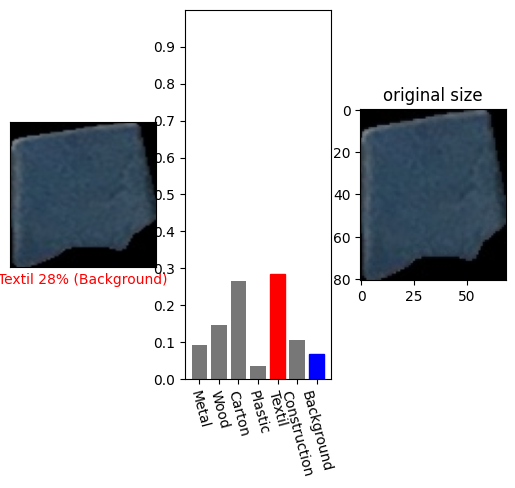

('Yoni', 'DJI_20230221091125_0053_V', 5, 'mask_32', (620, 504))


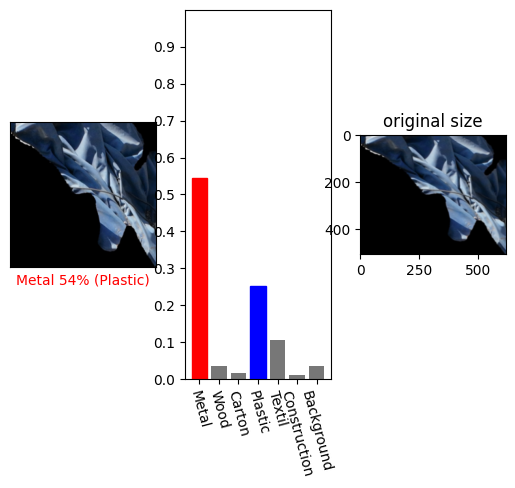

('Yoni', 'DJI_20230221091300_0086_V', 4, 'mask_10', (148, 160))


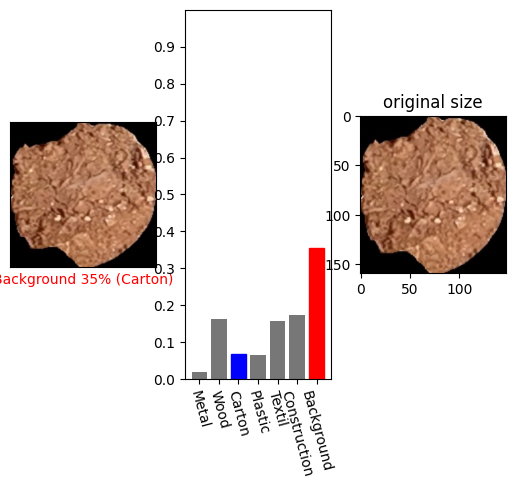

('Adi', 'DJI_20230221095224_0017_V', 14, 'mask_11', (96, 109))


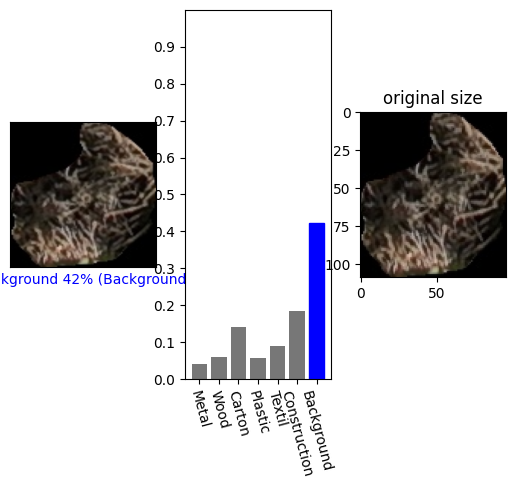

('Arik', 'DJI_20230221081744_0017_V', 2, 'mask_0', (139, 179))


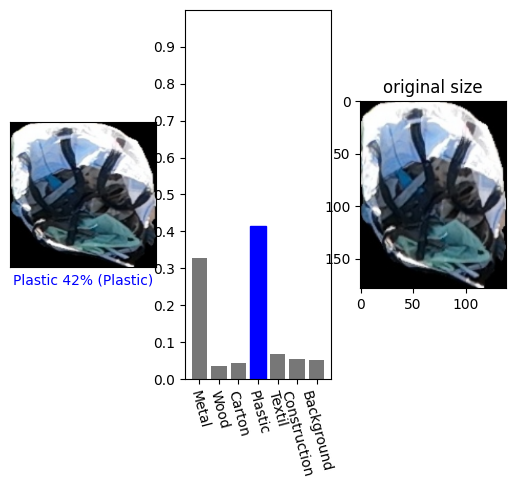

('Yoni', 'DJI_20230221095228_0020_V', 1, 'mask_108', (88, 57))


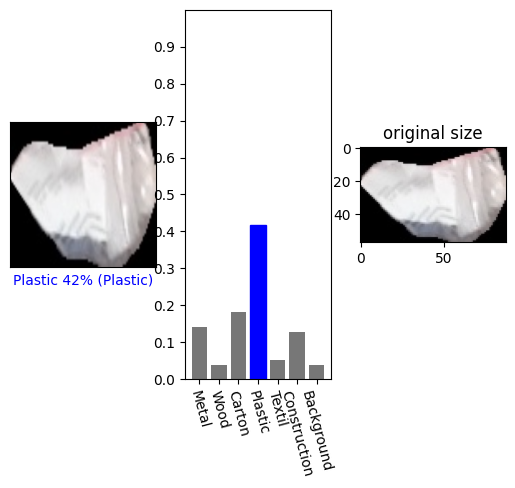

('Yoni', 'DJI_20230221095049_0049_V', 1, 'mask_6', (132, 211))


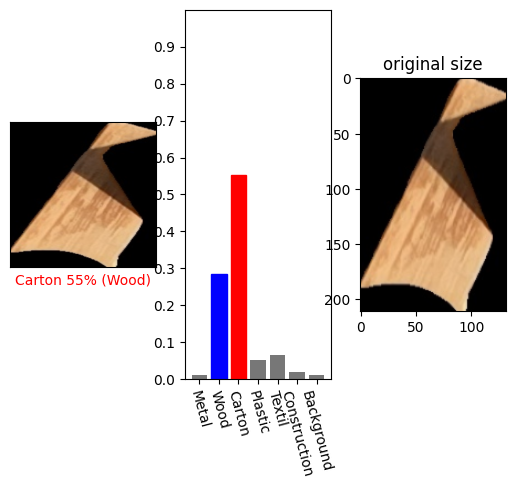

('Yoni', 'DJI_20230221095512_0069_V', 8, 'mask_109', (58, 59))


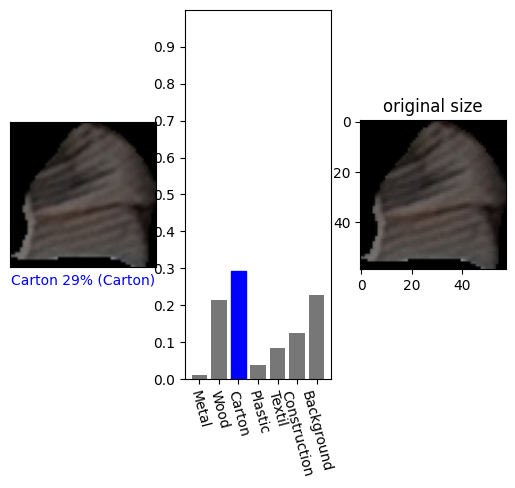

('Adi', 'DJI_20230221095630_0096_V', 3, 'mask_1', (340, 225))


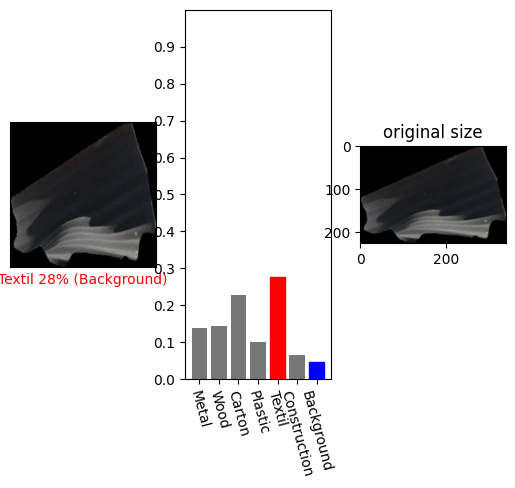

('Arik', 'DJI_20230221100213_0123_V', 14, 'mask_6', (68, 85))


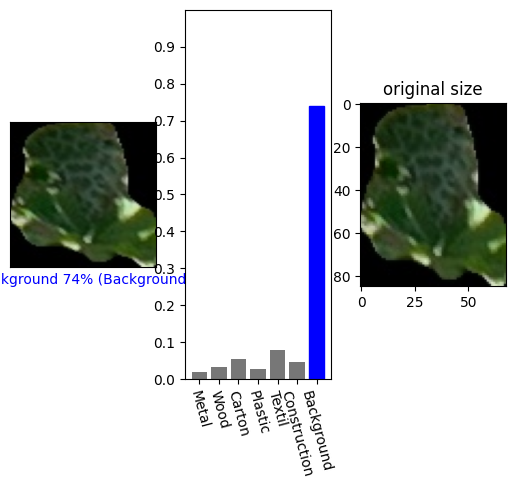

('Arik', 'DJI_20230221095213_0011_V', 14, 'mask_39', (86, 93))


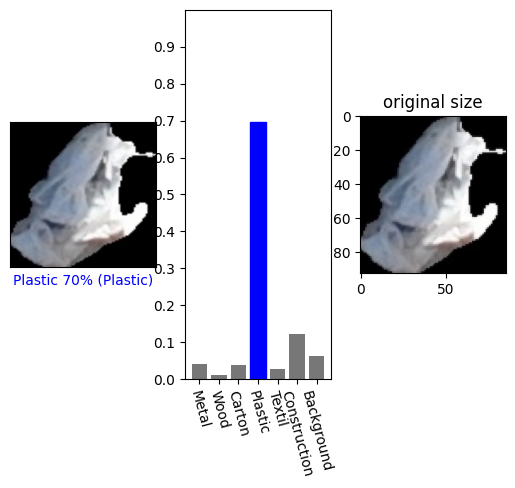

('Adi', 'DJI_20230221095630_0096_V', 7, 'mask_24', (255, 179))


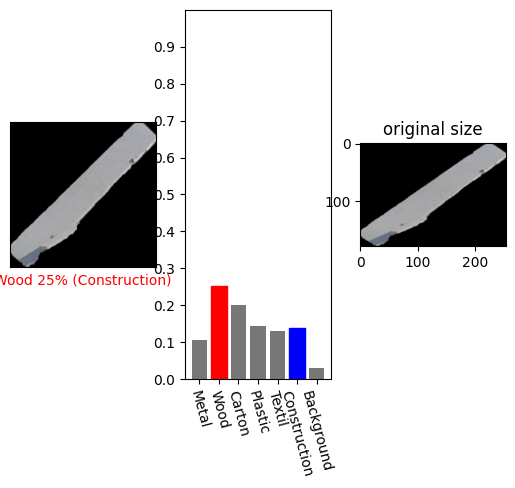

('Arik', 'DJI_20230221100215_0124_V', 9, 'mask_4', (188, 115))


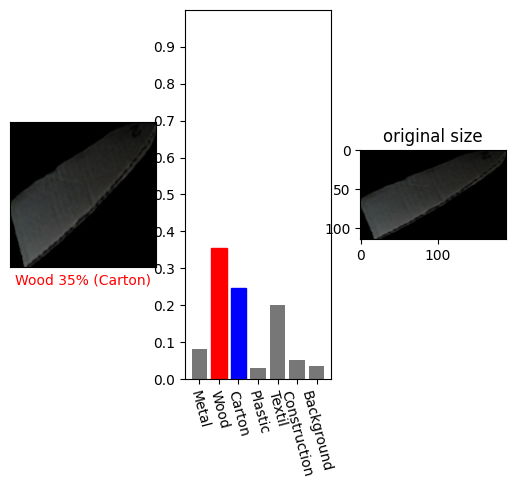

('Adi', 'DJI_20230221095237_0023_V', 13, 'mask_27', (148, 61))


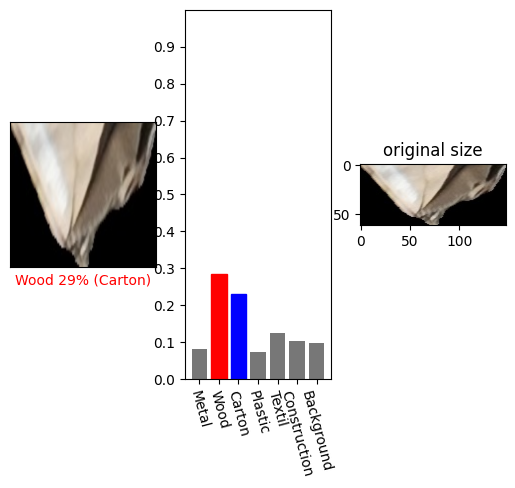

('Adi', 'DJI_20230221095630_0096_V', 4, 'mask_3', (173, 147))


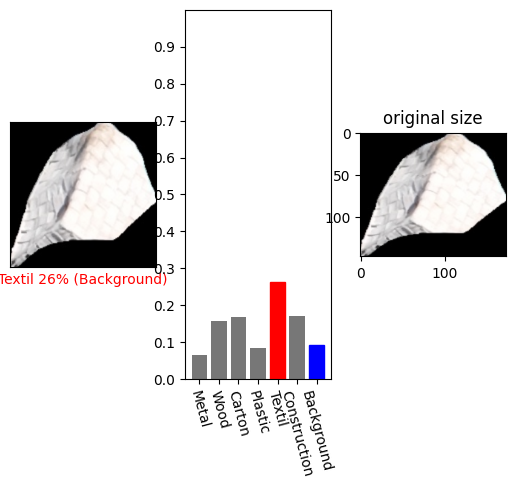

('Yoni', 'DJI_20230221093958_0112_V', 9, 'mask_16', (126, 48))


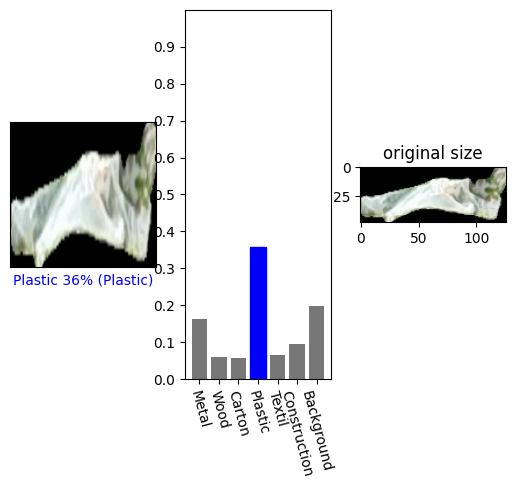

('Arik', 'DJI_20230221095305_0034_V', 8, 'mask_0', (529, 415))


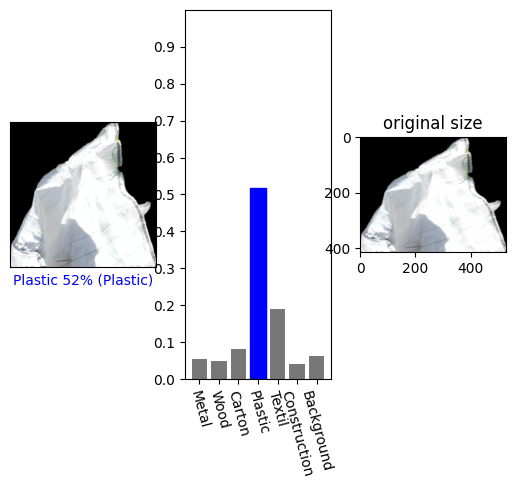

('Adi', 'DJI_20230221095511_0068_V', 6, 'mask_27', (565, 223))


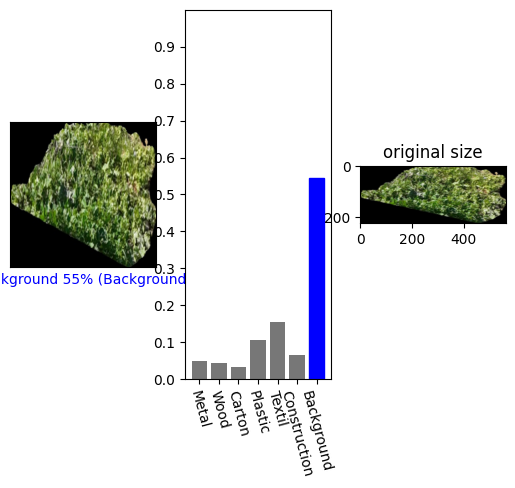

('Adi', 'DJI_20230221095408_0051_V', 6, 'mask_21', (115, 73))


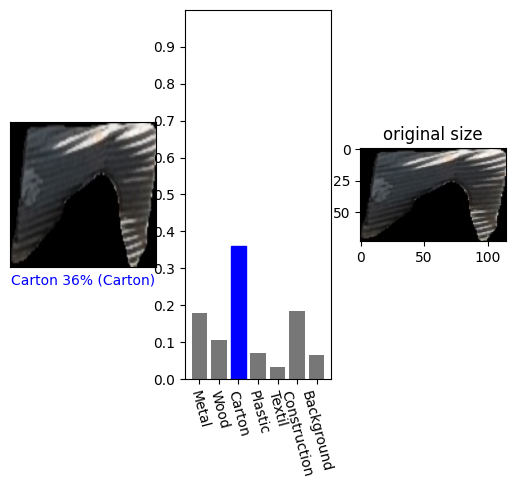

('Arik', 'DJI_20230221091035_0034_V', 9, 'mask_54', (73, 53))


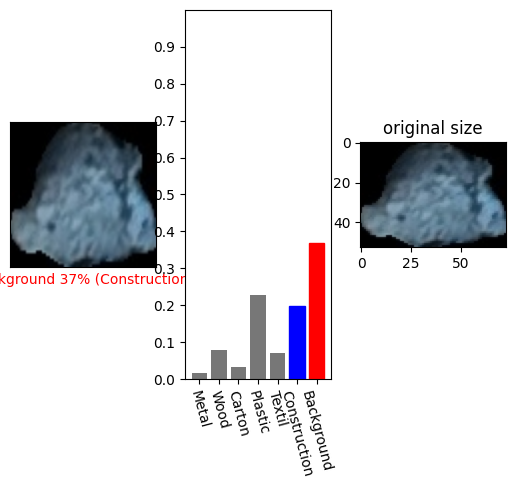

('Yoni', 'DJI_20230221091309_0089_V', 2, 'mask_0', (177, 110))


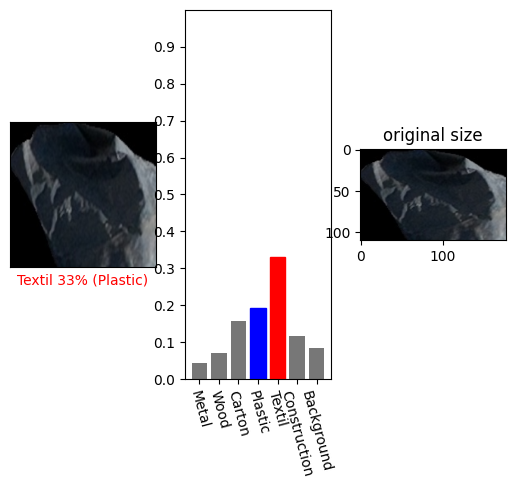

('Arik', 'DJI_20230221095459_0062_V', 5, 'mask_5', (94, 113))


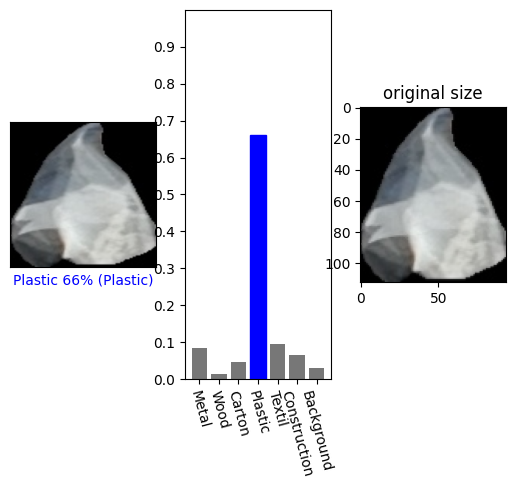

('Arik', 'DJI_20230221095213_0011_V', 3, 'mask_0', (103, 179))


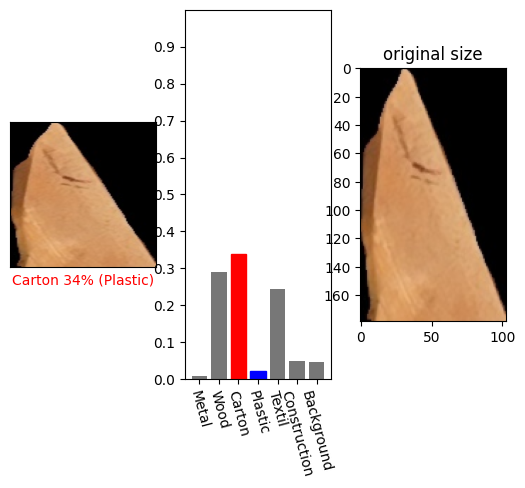

('Yoni', 'DJI_20230221091125_0053_V', 0, 'mask_27', (294, 171))


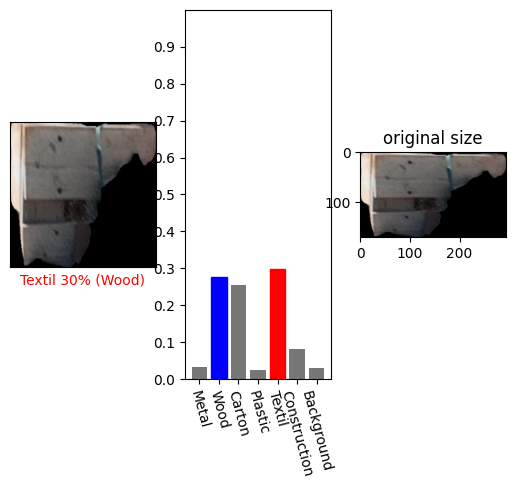

('Arik', 'DJI_20230221081744_0017_V', 6, 'mask_10', (94, 80))


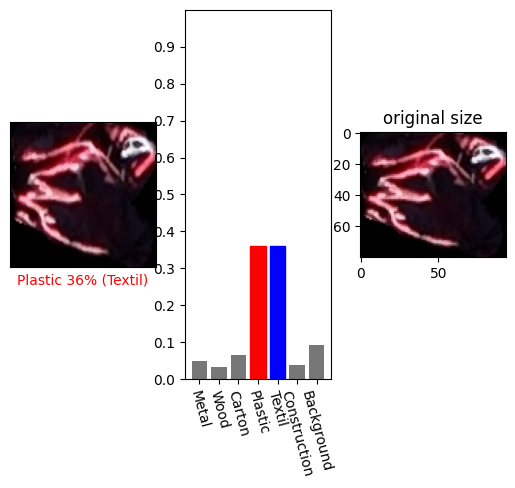

('Yoni', 'DJI_20230221095512_0069_V', 7, 'mask_1', (225, 199))


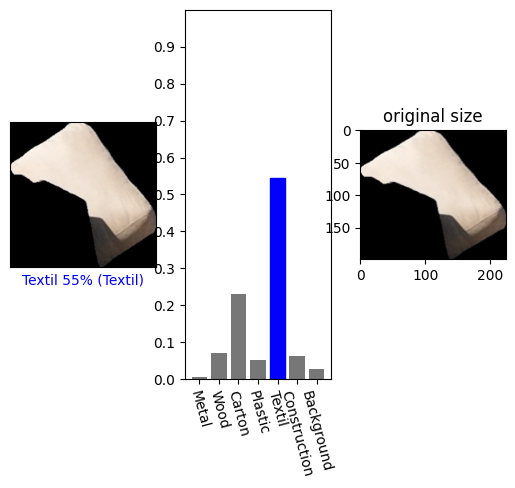

('Adi', 'DJI_20230221095511_0068_V', 8, 'mask_113', (80, 62))


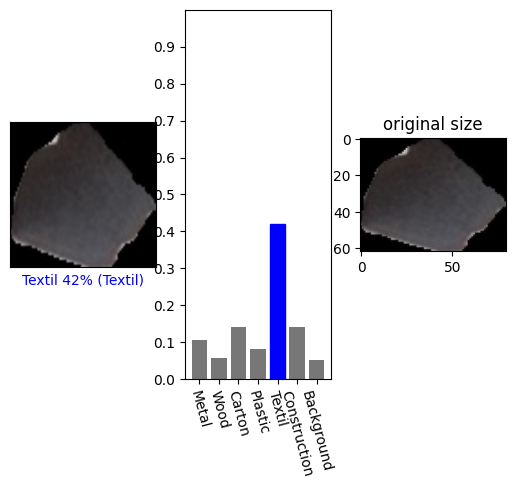

('Arik', 'DJI_20230221100213_0123_V', 5, 'mask_46', (442, 74))


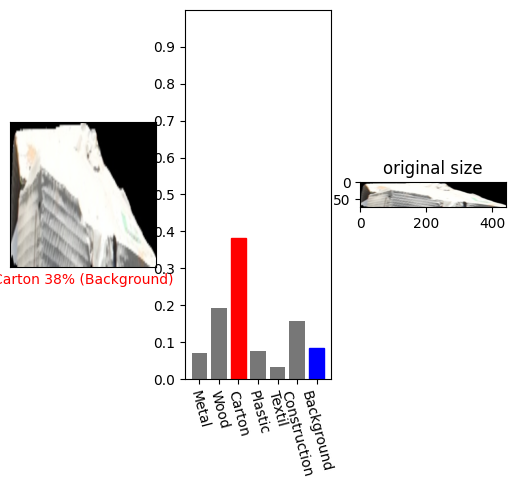

('Arik', 'DJI_20230221100215_0124_V', 9, 'mask_54', (89, 101))


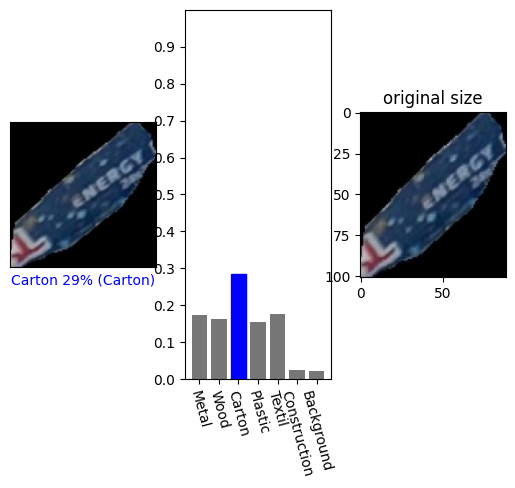

('Adi', 'DJI_20230221095630_0096_V', 6, 'mask_23', (192, 140))


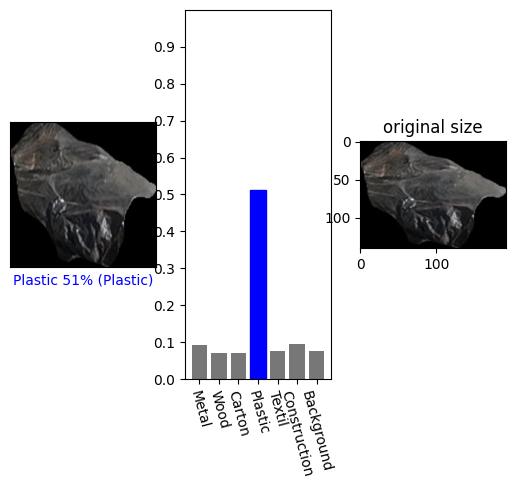

('Yoni', 'DJI_20230221091125_0053_V', 4, 'mask_32', (97, 108))


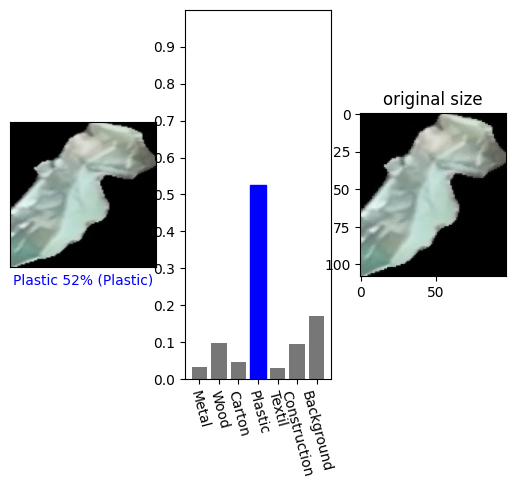

('Yoni', 'DJI_20230221095228_0020_V', 0, 'mask_50', (91, 93))


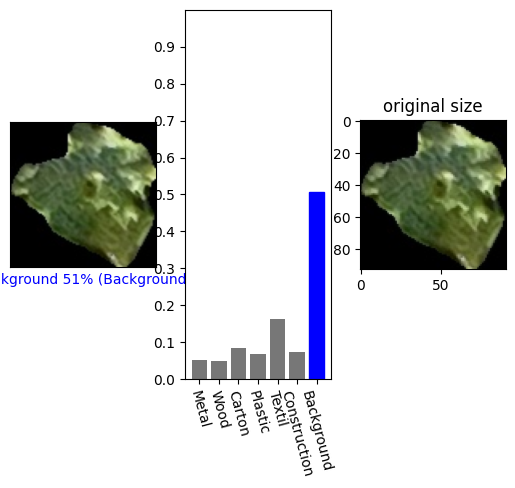

('Yoni', 'DJI_20230221095228_0020_V', 0, 'mask_7', (85, 104))


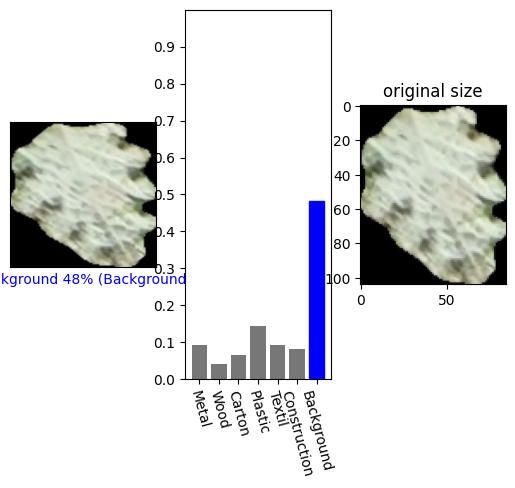

('Arik', 'DJI_20230221100215_0124_V', 0, 'mask_28', (538, 513))


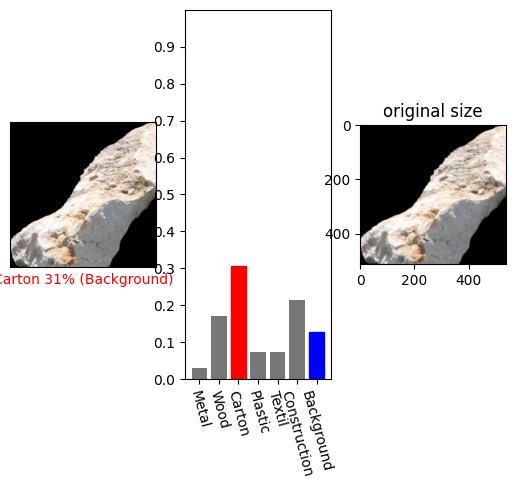

('Yoni', 'DJI_20230221095228_0020_V', 2, 'mask_5', (145, 460))


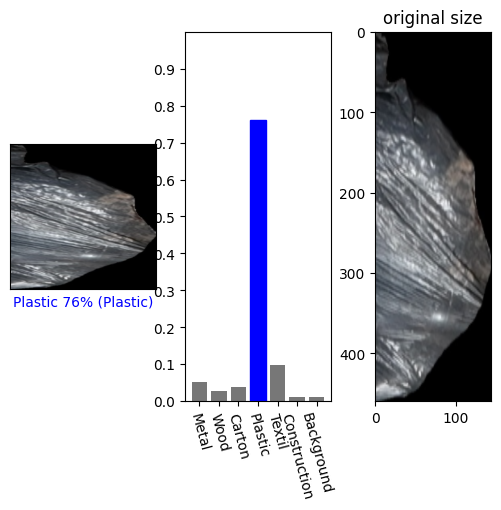

('Arik', 'DJI_20230221100213_0123_V', 5, 'mask_22', (256, 224))


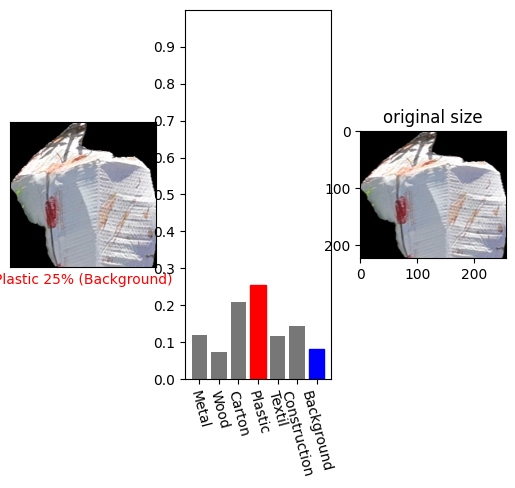

('Arik', 'DJI_20230221091035_0034_V', 7, 'mask_68', (60, 71))


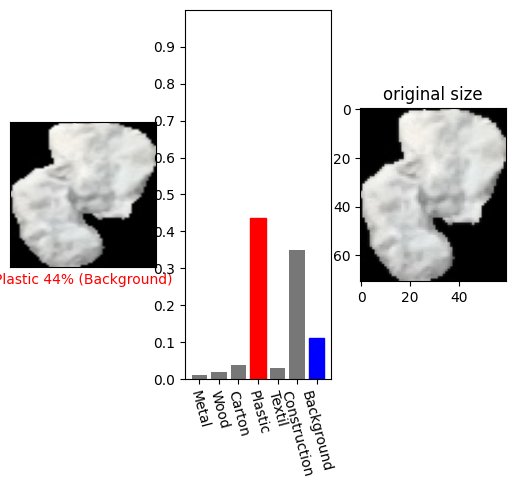

('Arik', 'DJI_20230221081744_0017_V', 13, 'mask_7', (176, 62))


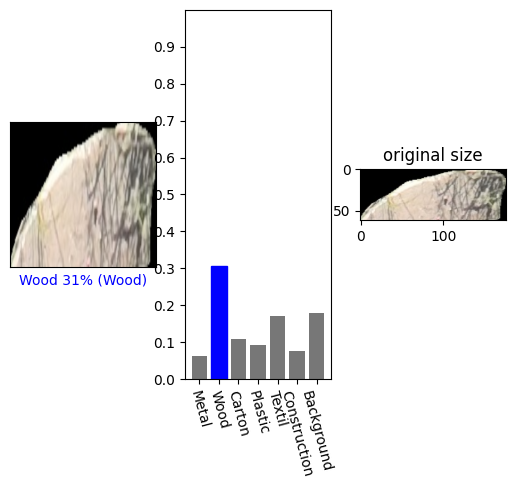

('Yoni', 'DJI_20230221100140_0114_V', 2, 'mask_16', (68, 247))


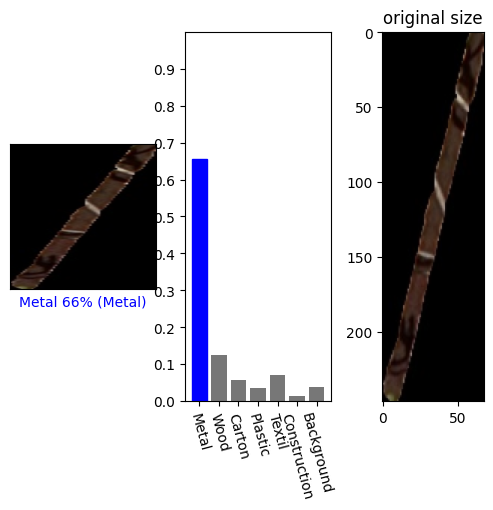

('Adi', 'DJI_20230221095237_0023_V', 1, 'mask_40', (137, 111))


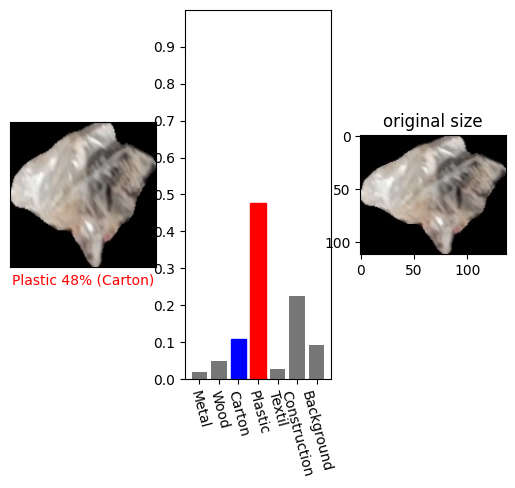

('Adi', 'DJI_20230221095511_0068_V', 9, 'mask_17', (116, 120))


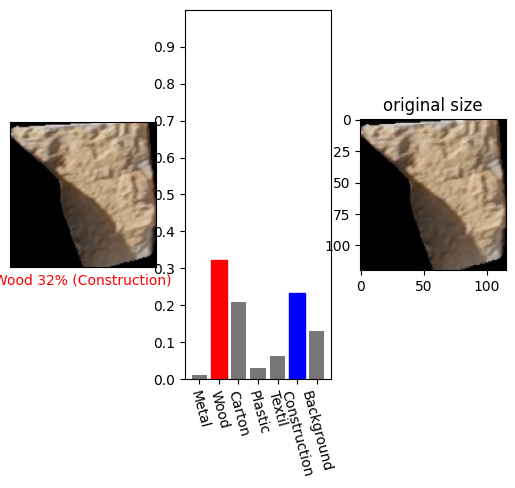

('Arik', 'DJI_20230221100213_0123_V', 1, 'mask_56', (75, 66))


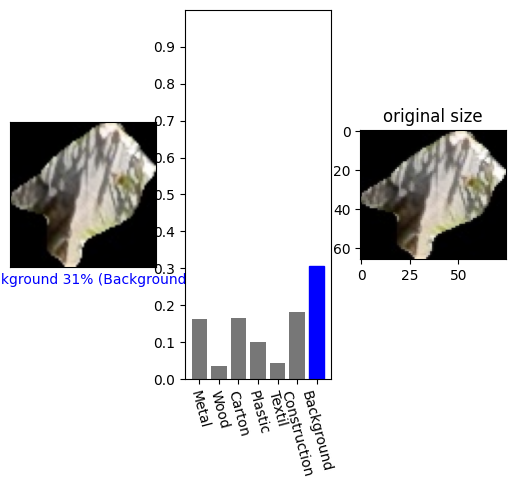

('Arik', 'DJI_20230221100215_0124_V', 10, 'mask_28', (125, 92))


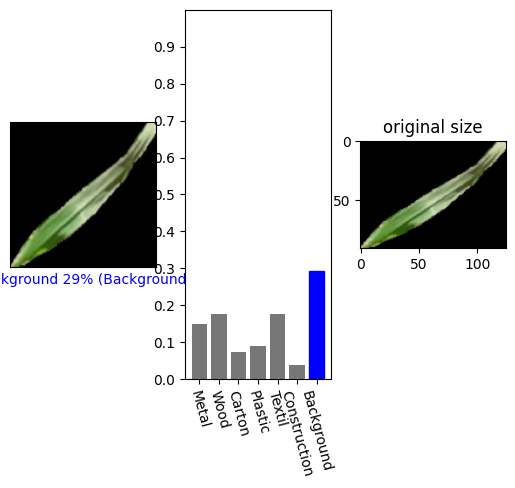

('Adi', 'DJI_20230221095630_0096_V', 3, 'mask_4', (144, 105))


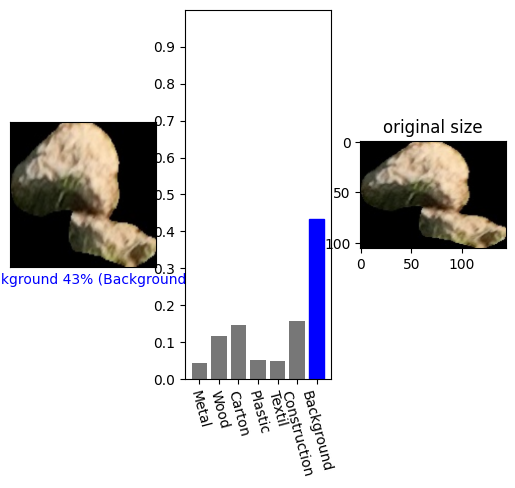

('Adi', 'DJI_20230221095408_0051_V', 2, 'mask_5', (121, 129))


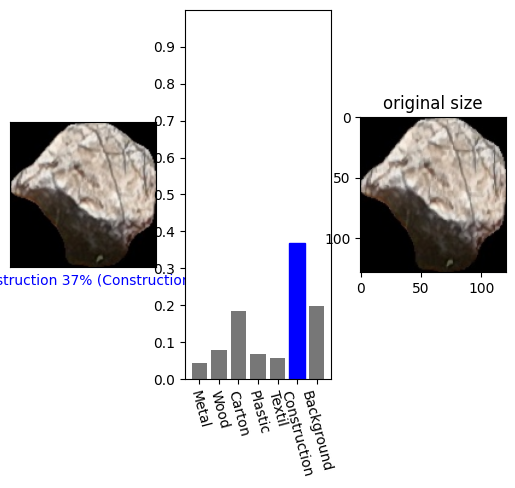

('Yoni', 'DJI_20230221100140_0114_V', 4, 'mask_10', (129, 87))


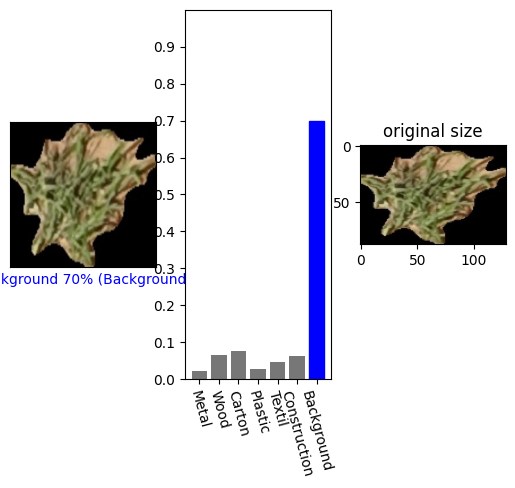

In [ ]:
import scipy.special
outputs = model((bad_predictions[0], bad_predictions[1]))
_, preds = torch.max(outputs, 1)
outputs = outputs.cpu().detach().numpy()
outputs = np.array(outputs)
# print(outputs)
outputs = scipy.special.softmax(outputs,1)
print(f'{len(outputs)} wrong of 64:')
# _, preds = torch.max(outputs, 1)
# print(sizes)
# print(zip(bad_predictions, preds))
for im, feat, lab, pred, out in zip(bad_predictions[0], bad_predictions[1], bad_predictions[2], preds, outputs):
  # print()
  im = im.cpu()
  s = sizes[f'{feat.cpu()}']
  print(s)
  t = transforms.Resize((s[-1][1], s[-1][0]))
  im2 = t(im)
  # imshow(plt, im, f'predicted: {[i.item() for i in out]}, {reverse_labels_dict[pred.item()]}, actual: {reverse_labels_dict[lab.item()]}')

  plt.subplot(1,3,1)
  plot_image(out, lab.item(), im.cpu())
  plt.subplot(1,3,2)
  plot_value_array(out,  lab.item())
  plt.subplot(1,3,3)
  imshow(im2, 'original size')
  # plt.tight_layout(pad=50)
  # plt.subplot_tool()
  plt.show()

In [ ]:
for x in dataloaders['val']:
  inputs = x[0]

  labels=x[-1]
  break
  # print(inputs, labels)

In [ ]:
dataloaders['val']

In [ ]:
for i in dataloaders['val']:
  print(i)

In [ ]:
with torch.no_grad():
    for i,(inputs, labels) in enumerate(dataloaders['val']):
      inputs = inputs.cuda()
      labels = labels.cuda()
      outputs = model(inputs)
      _, preds = torch.max(outputs, 1)
      break




In [ ]:
class_names = [
              'Metal',
              'Wood',
              'Carton',
              'Concrete',
              'Plastic',
              'Nylon',
              'Rubber',
              'Textil/Fabric/Cloth',
              'Background']


def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i], img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  plt.imshow(img,cmap=plt.cm.binary)

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'green'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}%\n({})".format(class_names[predicted_label],
                                100*np.max(predictions_array),
                                class_names[true_label]),
                                color=color)

def plot_value_array(i, predictions_array, true_label):
  true_label = true_label[i]
  plt.grid(False)
  plt.xticks(range(len(predictions_array)), class_names, rotation=90)
  plt.yticks([])
  thisplot = plt.bar(range(len(predictions_array)), predictions_array, color="grey")
  plt.ylim([0, 1])
  predicted_label = np.argmax(predictions_array)
  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('green')

In [ ]:
np.array(outputs.cpu().data)[4]

In [ ]:
np.array(labels.cpu().data)

In [ ]:
np.array(inputs.cpu().data)[4]

In [ ]:
i = 0
plt.figure(figsize=(4,2))
plt.subplot(1,2,1)
plot_image(i, np.array(outputs.cpu().data)[i], np.array(labels.cpu().data), np.array(inputs.cpu().data)[i])
plt.subplot(1,2,2)
plot_value_array(i, np.array(outputs.cpu().data)[i],  np.array(labels.cpu().data))
plt.show()

In [ ]:
i = 1
plt.figure(figsize=(4,2))
plt.subplot(1,2,1)
plot_image(i, np.array(outputs.cpu().data)[i], np.array(labels.cpu().data), np.array(inputs.cpu().data)[i])
plt.subplot(1,2,2)
plot_value_array(i, np.array(outputs.cpu().data)[i],  np.array(labels.cpu().data))
plt.show()

In [ ]:
i = 2
plt.figure(figsize=(4,2))
plt.subplot(1,2,1)
plot_image(i, np.array(outputs.cpu().data)[i], np.array(labels.cpu().data), np.array(inputs.cpu().data)[i])
plt.subplot(1,2,2)
plot_value_array(i, np.array(outputs.cpu().data)[i],  np.array(labels.cpu().data))
plt.show()

In [ ]:
num_rows = 1
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*num_rows))
plt.subplots_adjust(wspace=0.1, hspace=2.5)
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_image(i, np.array(outputs.cpu().data)[i], np.array(labels.cpu().data), np.array(inputs.cpu().data)[i])
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_value_array(i, np.array(outputs.cpu().data)[i],  np.array(labels.cpu().data))
# plt.tight_layout()
plt.show()

In [ ]:
torch.save(model_transfered.state_dict(), "transfered_basic_resnet50")

Vision Transformer

In [ ]:
# from transformers import AutoFeatureExtractor, AutoModelForImageClassification

# extractor = AutoFeatureExtractor.from_pretrained("yangy50/garbage-classification")

# model = AutoModelForImageClassification.from_pretrained("yangy50/garbage-classification")

In [ ]:
! pip install transformers pytorch-lightning --quiet

In [ ]:
from transformers import ViTFeatureExtractor, ViTForImageClassification
# import pytorch_lightning as pl
from torchmetrics import Accuracy

In [ ]:
from PIL import Image

class SplitDatasetMaskedResizedVIT(Dataset):
  def __init__(self, folder_path, image_name, sp):
    self.image_name = image_name
    self.sp = sp
    self.im_path = f'{folder_path}/{image_name}'
    self.split_path = f'{self.im_path}/split_{sp}'
    with open(f'{self.split_path}/seg_{sp}.yaml') as f:
      self.seg = yaml.safe_load(f)
    files_in_folder = os.listdir(self.split_path)
    self.ann_dict={image_name:{sp:{}}}
    if f'anns_{sp}.yaml' in files_in_folder:
      with open(f'{self.split_path}/anns_{sp}.yaml', 'r') as f:
        self.ann_dict = yaml.safe_load(f)
        # Remove all unknowns
        self.ann_dict[self.image_name][self.sp] = {key:val for key, val in self.ann_dict[self.image_name][self.sp].items() if val != 'Unknown'}

  def __len__(self):
    return len(self.ann_dict[self.image_name][self.sp])

  def __getitem__(self, idx):
    annotated_masks = list(self.ann_dict[self.image_name][self.sp].keys())
    m = annotated_masks[idx]
    img = cv2.imread(f'{self.split_path}/{m}.jpg')

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    im_pil = Image.fromarray(img)
    preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_tensor = preprocess(im_pil)
    # mask = rle_to_mask(self.seg[self.image_name][self.sp][m]['segmentation'])
    label = self.ann_dict[self.image_name][self.sp][m]
    y = labels_dict[label]
    return input_tensor, y



In [ ]:
from torchvision.datasets import ImageFolder

In [ ]:
# ds=ImageFolder(folder_path)

In [ ]:
arr = []
for image in images:
  for split in range(16):
    ds = SplitDatasetMaskedResizedVIT(folder_path, image, split)
    # print(ds[0])
    arr.append(ds)

vit_curr_dataset = torch.utils.data.ConcatDataset(arr)

vit_train_ds, vit_val_ds, vit_test_ds = torch.utils.data.random_split(vit_curr_dataset, [0.6, 0.2, 0.2])

In [ ]:
lab = torch.zeros(9).cuda()
for y in [x[1] for x in vit_curr_dataset]:
    lab[y] += 1
lab = lab/lab.norm()
lab = 1/lab
lab[6] = 0
print(lab)

In [ ]:
class ImageClassificationCollator:
    def __init__(self, feature_extractor):
        self.feature_extractor = feature_extractor

    def __call__(self, batch):
        encodings = self.feature_extractor([x[0] for x in batch], return_tensors='pt')
        encodings['labels'] = torch.tensor([x[1] for x in batch], dtype=torch.long)
        return encodings

In [ ]:
feature_extractor = ViTFeatureExtractor(do_normalize=False).from_pretrained('google/vit-base-patch16-224-in21k')

In [ ]:
vit_model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224-in21k',
    num_labels=9,
    label2id={i:x for x, i in reverse_labels_dict.items()},
    id2label=reverse_labels_dict
)
collator = ImageClassificationCollator(feature_extractor)
vit_train_loader = DataLoader(vit_train_ds, batch_size=64, collate_fn=collator, num_workers=2, shuffle=True)
vit_val_loader = DataLoader(vit_val_ds, batch_size=64, collate_fn=collator, num_workers=2)

In [ ]:
from torch.optim import AdamW

optimizer = AdamW(vit_model.parameters(), lr=1e-2)

In [ ]:
from transformers import get_scheduler

num_epochs = 50
num_training_steps = num_epochs * len(vit_train_loader)
lr_scheduler = get_scheduler(
    name="linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps
)

In [ ]:
import torch

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
vit_model.to(device)

In [ ]:
! pip install datasets

In [ ]:
# from tqdm.auto import tqdm

# progress_bar = tqdm(range(num_training_steps))

# vit_model.train()
# for epoch in range(num_epochs):
#     total_loss = 0
#     total_acc = 0
#     count = 0
#     for batch in vit_train_loader:
#         count += 1
#         batch = {k: v.to(device) for k, v in batch.items()}
#         outputs = vit_model(**batch)
#         loss = outputs.loss
#         loss.backward()
#         total_loss += loss.item()

#         logits = outputs.logits
#         predictions = torch.argmax(logits, dim=-1)
#         total_acc += (predictions == batch['labels']).sum()/len(batch)
#         print(predictions, batch['labels'])
#         optimizer.step()
#         lr_scheduler.step()
#         optimizer.zero_grad()
#         progress_bar.update(1)
#     print("Loss: " + str(total_loss/count) + " Accuracy: " + str(total_acc.item()/count))

In [ ]:
!pip install transformers[torch]

In [ ]:
!pip install accelerate -U

In [ ]:
!pip install --upgrade accelerate
!pip install transformers==4.28.0

In [ ]:
from transformers import TrainingArguments

training_args = TrainingArguments(
  output_dir="./vit-model_basic",
  per_device_train_batch_size=64,
  evaluation_strategy="steps",
  num_train_epochs=50,
  fp16=True,
  save_steps=100,
  eval_steps=100,
  logging_steps=10,
  learning_rate=2e-2,
  save_total_limit=2,
  remove_unused_columns=False,
  push_to_hub=False,
  report_to='tensorboard',
  load_best_model_at_end=True,
)

In [ ]:
from datasets import load_metric
metric = load_metric("accuracy")
def compute_metrics(p):
    return metric.compute(predictions=np.argmax(p.predictions, axis=1), references=p.label_ids)

In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=vit_model,
    args=training_args,
    data_collator=collator,
    compute_metrics=compute_metrics,
    train_dataset=vit_train_ds,
    eval_dataset=vit_val_ds,
    tokenizer=feature_extractor,
)

In [ ]:
train_results = trainer.train()
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

In [ ]:
metrics = trainer.evaluate(vit_val_ds)
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

In [ ]:
from datasets import load_metric

In [ ]:
metric = load_metric("accuracy")
vit_model.eval()
for batch in vit_val_loader:
    batch = {k: v.to(device) for k, v in batch.items()}
    with torch.no_grad():
        outputs = vit_model(**batch)

    logits = outputs.logits
    predictions = torch.argmax(logits, dim=-1)
    metric.add_batch(predictions=predictions, references=batch["labels"])

metric.compute()